In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
!pip install opencv-python opencv-python-headless scikit-learn numpy tqdm moviepy

In [ ]:
import cv2
import os
from tqdm import tqdm

def extract_frames(video_path, output_folder, frame_rate=1):
    os.makedirs(output_folder, exist_ok=True)
    vidcap = cv2.VideoCapture(video_path)
    success, image = vidcap.read()
    count = 0
    while success:
        if count % frame_rate == 0:
            frame_path = os.path.join(output_folder, f"frame{count}.jpg")
            cv2.imwrite(frame_path, image)
        success, image = vidcap.read()
        count += 1

input_folder = '/content/drive/My Drive/output_segments_no_audio'
output_folder = '/content/frames'
frame_rate = 10  # Extract one frame per second

for video_file in tqdm(os.listdir(input_folder)):
    video_path = os.path.join(input_folder, video_file)
    video_output_folder = os.path.join(output_folder, os.path.splitext(video_file)[0])
    extract_frames(video_path, video_output_folder, frame_rate)

100%|██████████| 649/649 [03:12<00:00,  3.37it/s]


In [ ]:
def resize_frames(input_folder, output_folder, size=(224, 224)):
    os.makedirs(output_folder, exist_ok=True)
    for root, _, files in os.walk(input_folder):
        for file in files:
            if file.endswith(".jpg"):
                frame_path = os.path.join(root, file)
                image = cv2.imread(frame_path)
                resized_image = cv2.resize(image, size)
                relative_path = os.path.relpath(root, input_folder)
                output_path = os.path.join(output_folder, relative_path, file)
                os.makedirs(os.path.dirname(output_path), exist_ok=True)
                cv2.imwrite(output_path, resized_image)

input_folder = '/content/frames'
output_folder = '/content/resized_frames'
resize_frames(input_folder, output_folder)

In [ ]:
import random
import os
import shutil
from IPython.display import display, Image
import ipywidgets as widgets
from IPython.display import clear_output

def select_random_frames(resized_frames_dir, num_samples=20):
    all_frames = []
    for root, _, files in os.walk(resized_frames_dir):
        for file in files:
            if file.endswith(".jpg"):
                all_frames.append(os.path.join(root, file))
    sampled_frames = random.sample(all_frames, num_samples)
    return sampled_frames

def classify_frames(sampled_frames):
    manual_labels = []

    def on_button_clicked(b):
        clear_output(wait=True)
        label_value = label_widget.value
        frame_path = frame_paths.pop(0)
        manual_labels.append((frame_path, label_value))
        if frame_paths:
            display_next_frame()
        else:
            move_classified_frames(manual_labels, manual_label_violent, manual_label_nonviolent)
            print("All frames classified and moved successfully.")

    def display_next_frame():
        frame_path = frame_paths[0]
        display(Image(filename=frame_path))
        display(label_widget)
        display(button)

    frame_paths = sampled_frames.copy()
    label_widget = widgets.Dropdown(
        options=[('Non-violent', 0), ('Violent', 1)],
        value=0,
        description='Label:',
    )
    button = widgets.Button(description="Submit")
    button.on_click(on_button_clicked)

    display_next_frame()

def move_classified_frames(manual_labels, manual_label_violent, manual_label_nonviolent):
    os.makedirs(manual_label_violent, exist_ok=True)
    os.makedirs(manual_label_nonviolent, exist_ok=True)
    for frame_path, label in manual_labels:
        if label == 1:
            shutil.move(frame_path, os.path.join(manual_label_violent, os.path.basename(frame_path)))
        else:
            shutil.move(frame_path, os.path.join(manual_label_nonviolent, os.path.basename(frame_path)))

resized_frames_dir = '/content/resized_frames'
manual_label_violent = '/content/drive/My Drive/manual_labels/violent'
manual_label_nonviolent = '/content/drive/My Drive/manual_labels/non-violent'

# Select and classify random frames
num_samples = 20
sampled_frames = select_random_frames(resized_frames_dir, num_samples)
classify_frames(sampled_frames)


All frames classified and moved successfully.


In [ ]:
import numpy as np
from keras.preprocessing import image
from keras.applications.vgg16 import VGG16, preprocess_input
import os

model = VGG16(weights='imagenet', include_top=False)

def extract_features(frame_path, model):
    img = image.load_img(frame_path, target_size=(224, 224))
    img_data = image.img_to_array(img)
    img_data = np.expand_dims(img_data, axis=0)
    img_data = preprocess_input(img_data)
    features = model.predict(img_data)
    return features.flatten()

def extract_features_from_folders(folders, labels, output_file):
    features = []
    label_list = []
    all_frames = []

    for folder, label in zip(folders, labels):
        for root, _, files in os.walk(folder):
            for file in files:
                if file.endswith(".jpg"):
                    frame_path = os.path.join(root, file)
                    feature = extract_features(frame_path, model)
                    features.append(feature)
                    label_list.append(label)
                    all_frames.append(frame_path)

    features = np.array(features)
    label_list = np.array(label_list)
    np.savez(output_file, features=features, labels=label_list)
    np.save('/content/all_frames.npy', all_frames)  # Save all_frames for later use

manual_label_violent = '/content/drive/My Drive/manual_labels/violent'
manual_label_nonviolent = '/content/drive/My Drive/manual_labels/non-violent'
unlabeled_folder = '/content/resized_frames'

folders = [manual_label_violent, manual_label_nonviolent, unlabeled_folder]
labels = [1, 0, -1]  # -1 for unlabeled

output_file = '/content/features.npz'
extract_features_from_folders(folders, labels, output_file)

Streaming output truncated to the last 5000 lines.
1/1 [==============================] - 0s 127ms/step


In [ ]:
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score

# Load the features and labels
data = np.load('/content/features.npz')
features = data['features']
labels = data['labels']

# Filter out unlabeled data
labeled_indices = labels != -1
features_labeled = features[labeled_indices]
labels_labeled = labels[labeled_indices]

# Split the labeled data
X_train, X_test, y_train, y_test = train_test_split(features_labeled, labels_labeled, test_size=0.2, random_state=42, stratify=labels_labeled)

# Train the initial model
model = SVC(probability=True)
model.fit(X_train, y_train)

# Evaluate the model
predictions = model.predict(X_test)
print(f"Initial accuracy: {accuracy_score(y_test, predictions)}")

Initial accuracy: 0.6


In [ ]:
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score
from IPython.display import display, Image
import ipywidgets as widgets
from IPython.display import clear_output

# Load all_frames
all_frames = np.load('/content/all_frames.npy').tolist()

# Function to get the most uncertain samples
def get_uncertain_samples(model, features, n_samples=10):
    probabilities = model.predict_proba(features)
    uncertainty = np.max(probabilities, axis=1)
    uncertain_indices = np.argsort(uncertainty)[:n_samples]
    return uncertain_indices

# Function to display and classify uncertain samples
def classify_uncertain_samples(sampled_frames):
    manual_labels = []
    frame_paths = list(sampled_frames)  # Convert to list

    def on_button_clicked(b):
        clear_output(wait=True)
        if frame_paths:
            label_value = label_widget.value
            frame_path = frame_paths.pop(0)
            manual_labels.append((frame_path, label_value))
            if frame_paths:
                display_next_frame()
            else:
                update_labels(manual_labels)
                retrain_model()
                print("All uncertain frames classified and model retrained. You can rerun this cell to continue improving the model.")
        else:
            print("No more frames to classify.")

    def display_next_frame():
        if frame_paths:
            frame_path = frame_paths[0]
            display(Image(filename=frame_path))
            display(label_widget)
            display(button)
        else:
            print("No more frames to display.")

    label_widget = widgets.Dropdown(
        options=[('Non-violent', 0), ('Violent', 1)],
        value=0,
        description='Label:',
    )
    button = widgets.Button(description="Submit")
    button.on_click(on_button_clicked)

    display_next_frame()

# Function to update the labels with the new manual classifications
def update_labels(manual_labels):
    for frame_path, label in manual_labels:
        # Find the index of the frame path in the original list of all frames
        idx = all_frames.index(frame_path)
        labels[idx] = label

    # Save updated labels
    np.savez(output_file, features=features, labels=labels)

# Function to retrain the model with updated labels
def retrain_model():
    labeled_indices = labels != -1
    features_labeled = features[labeled_indices]
    labels_labeled = labels[labeled_indices]

    X_train, X_test, y_train, y_test = train_test_split(features_labeled, labels_labeled, test_size=0.2, random_state=42, stratify=labels_labeled)

    model = SVC(probability=True)
    model.fit(X_train, y_train)

    predictions = model.predict(X_test)
    print(f"Updated accuracy: {accuracy_score(y_test, predictions)}")

# Load the features and labels
data = np.load('/content/features.npz')
features = data['features']
labels = data['labels']

# Filter out unlabeled data
unlabeled_indices = labels == -1
features_unlabeled = features[unlabeled_indices]

# Train the initial model
labeled_indices = labels != -1
features_labeled = features[labeled_indices]
labels_labeled = labels[labeled_indices]

X_train, X_test, y_train, y_test = train_test_split(features_labeled, labels_labeled, test_size=0.2, random_state=42, stratify=labels_labeled)
model = SVC(probability=True)
model.fit(X_train, y_train)

predictions = model.predict(X_test)
print(f"Initial accuracy: {accuracy_score(y_test, predictions)}")

# Active learning loop
n_samples = 10
uncertain_indices = get_uncertain_samples(model, features_unlabeled, n_samples)
unlabeled_paths = np.array([frame for frame in all_frames if frame.endswith(".jpg")])[unlabeled_indices]
sampled_paths = unlabeled_paths[uncertain_indices]
classify_uncertain_samples(sampled_paths)

Updated accuracy: 0.7
All uncertain frames classified and model retrained. You can rerun this cell to continue improving the model.


In [ ]:
import joblib

# Save the trained model
model_filename = '/content/drive/My Drive/violent_detection_model.pkl'
joblib.dump(model, model_filename)

print(f"Model saved to {model_filename}")

Model saved to /content/drive/My Drive/violent_detection_model.pkl


In [ ]:
# Save updated features and labels
output_file = '/content/drive/My Drive/updated_features_labels.npz'
np.savez(output_file, features=features, labels=labels)

print(f"Features and labels saved to {output_file}")

Features and labels saved to /content/drive/My Drive/updated_features_labels.npz


In [ ]:
import joblib

# Load the trained model
model_filename = '/content/drive/My Drive/violent_detection_model.pkl'
loaded_model = joblib.load(model_filename)

print(f"Model loaded from {model_filename}")

Model loaded from /content/drive/My Drive/violent_detection_model.pkl


In [ ]:
import numpy as np

# Load the updated features and labels
data_file = '/content/drive/My Drive/updated_features_labels.npz'
data = np.load(data_file)
features = data['features']
labels = data['labels']

print(f"Features and labels loaded from {data_file}")

Features and labels loaded from /content/drive/My Drive/updated_features_labels.npz


In [ ]:
import cv2
import os

def extract_frames(video_path, output_folder, frame_rate=1):
    os.makedirs(output_folder, exist_ok=True)
    vidcap = cv2.VideoCapture(video_path)
    success, image = vidcap.read()
    count = 0
    while success:
        if count % frame_rate == 0:
            frame_path = os.path.join(output_folder, f"frame{count}.jpg")
            cv2.imwrite(frame_path, image)
        success, image = vidcap.read()
        count += 1

new_video_path = '/path/to/new_video.mp4'
output_folder = '/content/new_frames'
extract_frames(new_video_path, output_folder, frame_rate=10)

In [ ]:
def resize_frames(input_folder, output_folder, size=(224, 224)):
    os.makedirs(output_folder, exist_ok=True)
    for root, _, files in os.walk(input_folder):
        for file in files:
            if file.endswith(".jpg"):
                frame_path = os.path.join(root, file)
                image = cv2.imread(frame_path)
                resized_image = cv2.resize(image, size)
                relative_path = os.path.relpath(root, input_folder)
                output_path = os.path.join(output_folder, relative_path, file)
                os.makedirs(os.path.dirname(output_path), exist_ok=True)
                cv2.imwrite(output_path, resized_image)

input_folder = '/content/new_frames'
output_folder = '/content/new_resized_frames'
resize_frames(input_folder, output_folder)

In [ ]:
from keras.preprocessing import image
from keras.applications.vgg16 import VGG16, preprocess_input

model = VGG16(weights='imagenet', include_top=False)

def extract_features(frame_path, model):
    img = image.load_img(frame_path, target_size=(224, 224))
    img_data = image.img_to_array(img)
    img_data = np.expand_dims(img_data, axis=0)
    img_data = preprocess_input(img_data)
    features = model.predict(img_data)
    return features.flatten()

def extract_features_from_folder(input_folder):
    features = []
    frame_paths = []
    for root, _, files in os.walk(input_folder):
        for file in files:
            if file.endswith(".jpg"):
                frame_path = os.path.join(root, file)
                feature = extract_features(frame_path, model)
                features.append(feature)
                frame_paths.append(frame_path)
    return np.array(features), frame_paths

input_folder = '/content/new_resized_frames'
new_features, frame_paths = extract_features_from_folder(input_folder)

58889256/58889256 [==============================] - 3s 0us/step


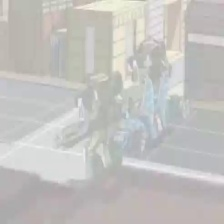

Frame: /content/new_resized_frames/frame3160.jpg
Prediction: Non-violent
Probability: [0.6512971 0.3487029]


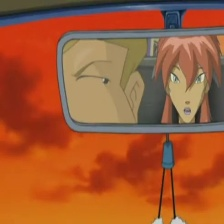

Frame: /content/new_resized_frames/frame3480.jpg
Prediction: Non-violent
Probability: [0.68076464 0.31923536]


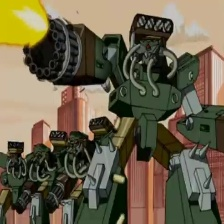

Frame: /content/new_resized_frames/frame4170.jpg
Prediction: Non-violent
Probability: [0.70740945 0.29259055]


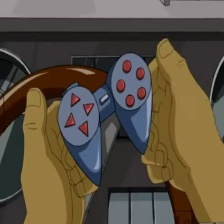

Frame: /content/new_resized_frames/frame3890.jpg
Prediction: Non-violent
Probability: [0.6782952 0.3217048]


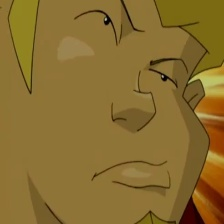

Frame: /content/new_resized_frames/frame1610.jpg
Prediction: Non-violent
Probability: [0.48675241 0.51324759]


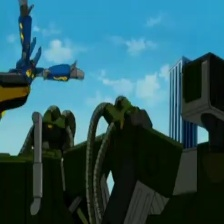

Frame: /content/new_resized_frames/frame2620.jpg
Prediction: Non-violent
Probability: [0.65834127 0.34165873]


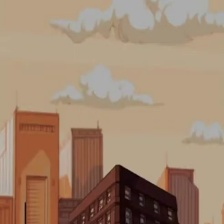

Frame: /content/new_resized_frames/frame3670.jpg
Prediction: Non-violent
Probability: [0.71802408 0.28197592]


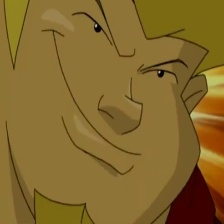

Frame: /content/new_resized_frames/frame1640.jpg
Prediction: Non-violent
Probability: [0.54515291 0.45484709]


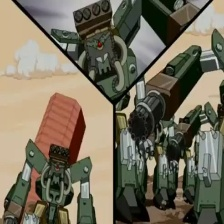

Frame: /content/new_resized_frames/frame480.jpg
Prediction: Non-violent
Probability: [0.73955574 0.26044426]


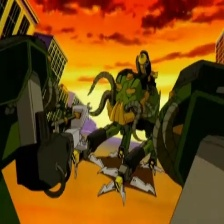

Frame: /content/new_resized_frames/frame4420.jpg
Prediction: Non-violent
Probability: [0.58022299 0.41977701]


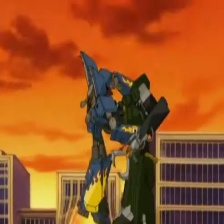

Frame: /content/new_resized_frames/frame2840.jpg
Prediction: Non-violent
Probability: [0.65923288 0.34076712]


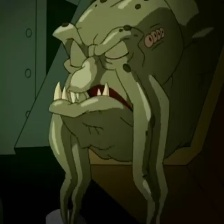

Frame: /content/new_resized_frames/frame3830.jpg
Prediction: Violent
Probability: [0.3633483 0.6366517]


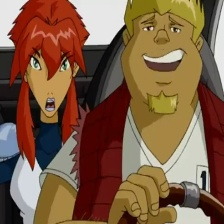

Frame: /content/new_resized_frames/frame1390.jpg
Prediction: Non-violent
Probability: [0.72236237 0.27763763]


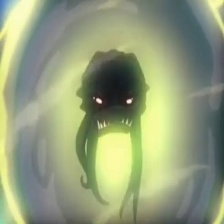

Frame: /content/new_resized_frames/frame990.jpg
Prediction: Non-violent
Probability: [0.52742482 0.47257518]


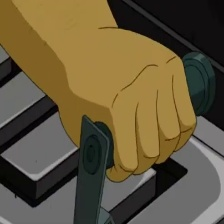

Frame: /content/new_resized_frames/frame1720.jpg
Prediction: Non-violent
Probability: [0.60209632 0.39790368]


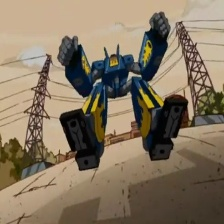

Frame: /content/new_resized_frames/frame3310.jpg
Prediction: Non-violent
Probability: [0.68022738 0.31977262]


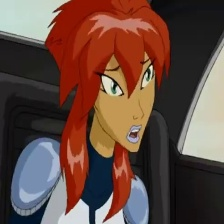

Frame: /content/new_resized_frames/frame1150.jpg
Prediction: Non-violent
Probability: [0.68860337 0.31139663]


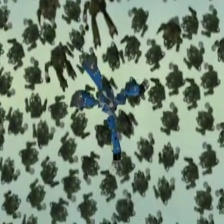

Frame: /content/new_resized_frames/frame2680.jpg
Prediction: Non-violent
Probability: [0.65869127 0.34130873]


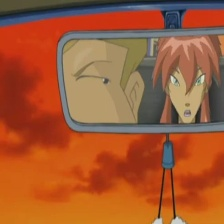

Frame: /content/new_resized_frames/frame3570.jpg
Prediction: Non-violent
Probability: [0.65760664 0.34239336]


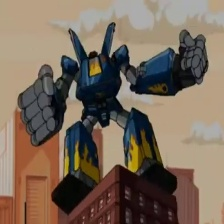

Frame: /content/new_resized_frames/frame3700.jpg
Prediction: Non-violent
Probability: [0.76356573 0.23643427]


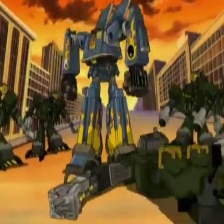

Frame: /content/new_resized_frames/frame2900.jpg
Prediction: Non-violent
Probability: [0.56032779 0.43967221]


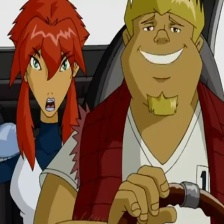

Frame: /content/new_resized_frames/frame1400.jpg
Prediction: Non-violent
Probability: [0.71886768 0.28113232]


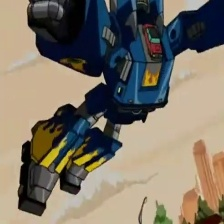

Frame: /content/new_resized_frames/frame2520.jpg
Prediction: Non-violent
Probability: [0.69141539 0.30858461]


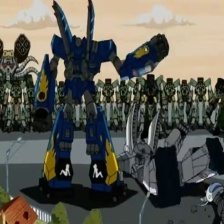

Frame: /content/new_resized_frames/frame1350.jpg
Prediction: Non-violent
Probability: [0.638979 0.361021]


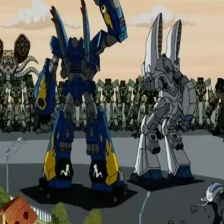

Frame: /content/new_resized_frames/frame1320.jpg
Prediction: Non-violent
Probability: [0.66197387 0.33802613]


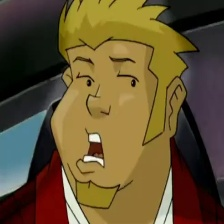

Frame: /content/new_resized_frames/frame1240.jpg
Prediction: Non-violent
Probability: [0.68879548 0.31120452]


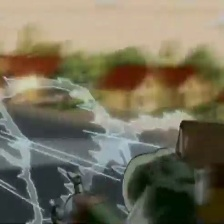

Frame: /content/new_resized_frames/frame2360.jpg
Prediction: Non-violent
Probability: [0.65535861 0.34464139]


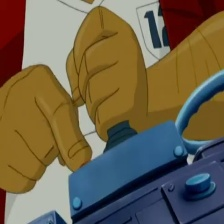

Frame: /content/new_resized_frames/frame2490.jpg
Prediction: Non-violent
Probability: [0.6593144 0.3406856]


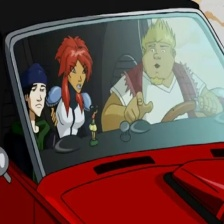

Frame: /content/new_resized_frames/frame1680.jpg
Prediction: Non-violent
Probability: [0.68201994 0.31798006]


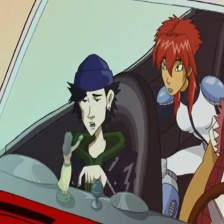

Frame: /content/new_resized_frames/frame270.jpg
Prediction: Non-violent
Probability: [0.67092204 0.32907796]


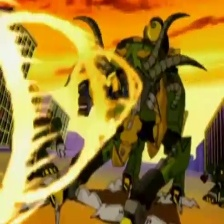

Frame: /content/new_resized_frames/frame4360.jpg
Prediction: Non-violent
Probability: [0.63537605 0.36462395]


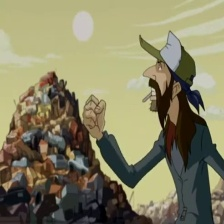

Frame: /content/new_resized_frames/frame3100.jpg
Prediction: Non-violent
Probability: [0.5 0.5]


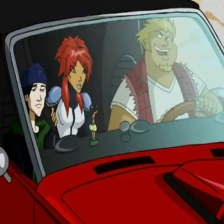

Frame: /content/new_resized_frames/frame1660.jpg
Prediction: Non-violent
Probability: [0.70075524 0.29924476]


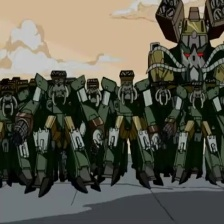

Frame: /content/new_resized_frames/frame1180.jpg
Prediction: Non-violent
Probability: [0.51497989 0.48502011]


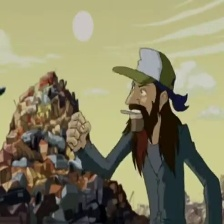

Frame: /content/new_resized_frames/frame3010.jpg
Prediction: Non-violent
Probability: [0.57365345 0.42634655]


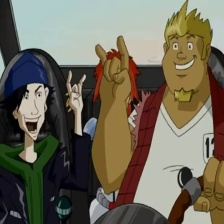

Frame: /content/new_resized_frames/frame4780.jpg
Prediction: Non-violent
Probability: [0.70513787 0.29486213]


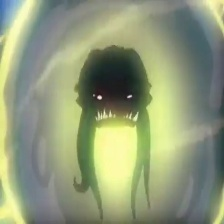

Frame: /content/new_resized_frames/frame940.jpg
Prediction: Non-violent
Probability: [0.53173791 0.46826209]


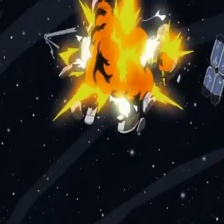

Frame: /content/new_resized_frames/frame2200.jpg
Prediction: Violent
Probability: [0.28708166 0.71291834]


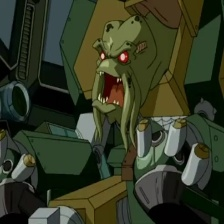

Frame: /content/new_resized_frames/frame790.jpg
Prediction: Non-violent
Probability: [0.51098177 0.48901823]


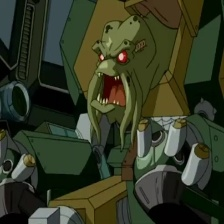

Frame: /content/new_resized_frames/frame780.jpg
Prediction: Non-violent
Probability: [0.52562499 0.47437501]


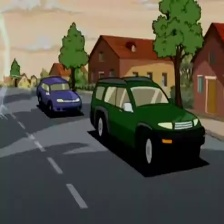

Frame: /content/new_resized_frames/frame2400.jpg
Prediction: Non-violent
Probability: [0.68408986 0.31591014]


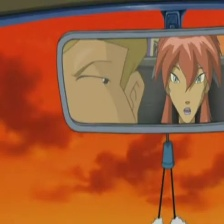

Frame: /content/new_resized_frames/frame3490.jpg
Prediction: Non-violent
Probability: [0.67856532 0.32143468]


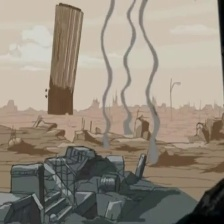

Frame: /content/new_resized_frames/frame4600.jpg
Prediction: Non-violent
Probability: [0.56888229 0.43111771]


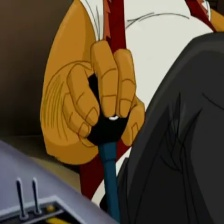

Frame: /content/new_resized_frames/frame3650.jpg
Prediction: Non-violent
Probability: [0.64942822 0.35057178]


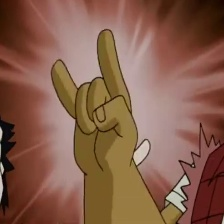

Frame: /content/new_resized_frames/frame4710.jpg
Prediction: Non-violent
Probability: [0.48382676 0.51617324]


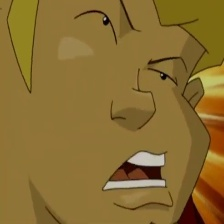

Frame: /content/new_resized_frames/frame1590.jpg
Prediction: Non-violent
Probability: [0.48658708 0.51341292]


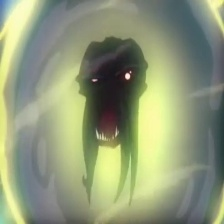

Frame: /content/new_resized_frames/frame970.jpg
Prediction: Non-violent
Probability: [0.61183312 0.38816688]


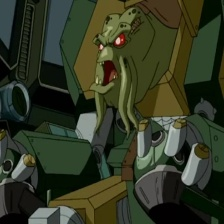

Frame: /content/new_resized_frames/frame860.jpg
Prediction: Non-violent
Probability: [0.5 0.5]


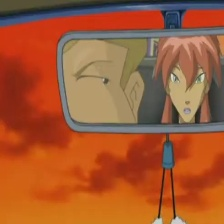

Frame: /content/new_resized_frames/frame3440.jpg
Prediction: Non-violent
Probability: [0.66902675 0.33097325]


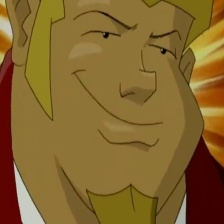

Frame: /content/new_resized_frames/frame1460.jpg
Prediction: Non-violent
Probability: [0.48013363 0.51986637]


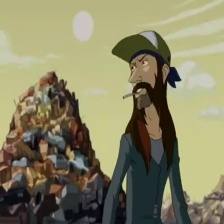

Frame: /content/new_resized_frames/frame3000.jpg
Prediction: Non-violent
Probability: [0.63326658 0.36673342]


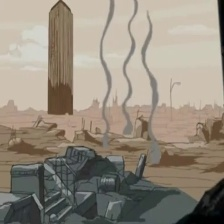

Frame: /content/new_resized_frames/frame4590.jpg
Prediction: Non-violent
Probability: [0.62176425 0.37823575]


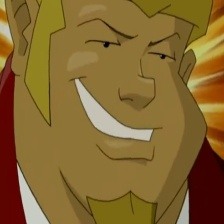

Frame: /content/new_resized_frames/frame1450.jpg
Prediction: Non-violent
Probability: [0.51212196 0.48787804]


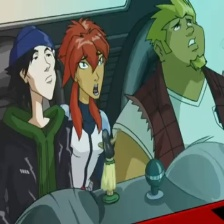

Frame: /content/new_resized_frames/frame1850.jpg
Prediction: Non-violent
Probability: [0.69827092 0.30172908]


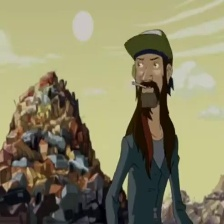

Frame: /content/new_resized_frames/frame2990.jpg
Prediction: Non-violent
Probability: [0.65058527 0.34941473]


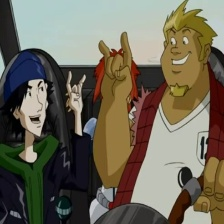

Frame: /content/new_resized_frames/frame4770.jpg
Prediction: Non-violent
Probability: [0.67175524 0.32824476]


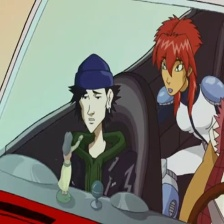

Frame: /content/new_resized_frames/frame170.jpg
Prediction: Non-violent
Probability: [0.66610491 0.33389509]


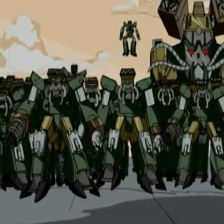

Frame: /content/new_resized_frames/frame1230.jpg
Prediction: Non-violent
Probability: [0.53667238 0.46332762]


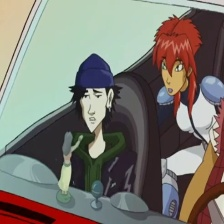

Frame: /content/new_resized_frames/frame50.jpg
Prediction: Non-violent
Probability: [0.67188489 0.32811511]


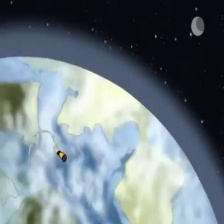

Frame: /content/new_resized_frames/frame2160.jpg
Prediction: Non-violent
Probability: [0.4726959 0.5273041]


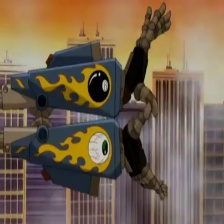

Frame: /content/new_resized_frames/frame3940.jpg
Prediction: Non-violent
Probability: [0.76709742 0.23290258]


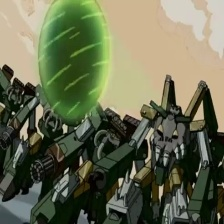

Frame: /content/new_resized_frames/frame920.jpg
Prediction: Non-violent
Probability: [0.70470687 0.29529313]


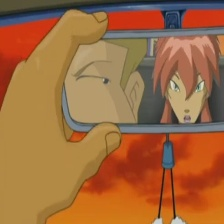

Frame: /content/new_resized_frames/frame3620.jpg
Prediction: Non-violent
Probability: [0.64313778 0.35686222]


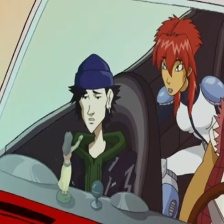

Frame: /content/new_resized_frames/frame80.jpg
Prediction: Non-violent
Probability: [0.66590641 0.33409359]


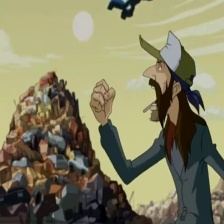

Frame: /content/new_resized_frames/frame3060.jpg
Prediction: Non-violent
Probability: [0.5 0.5]


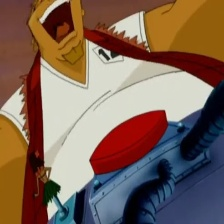

Frame: /content/new_resized_frames/frame4300.jpg
Prediction: Non-violent
Probability: [0.72748622 0.27251378]


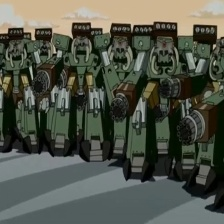

Frame: /content/new_resized_frames/frame550.jpg
Prediction: Non-violent
Probability: [0.54848095 0.45151905]


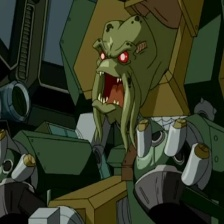

Frame: /content/new_resized_frames/frame800.jpg
Prediction: Non-violent
Probability: [0.52192488 0.47807512]


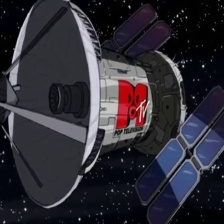

Frame: /content/new_resized_frames/frame2140.jpg
Prediction: Non-violent
Probability: [0.68438428 0.31561572]


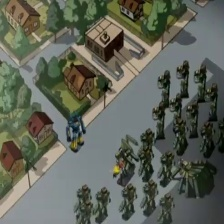

Frame: /content/new_resized_frames/frame1830.jpg
Prediction: Non-violent
Probability: [0.69623597 0.30376403]


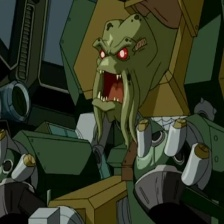

Frame: /content/new_resized_frames/frame830.jpg
Prediction: Non-violent
Probability: [0.51789992 0.48210008]


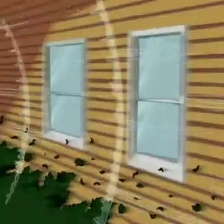

Frame: /content/new_resized_frames/frame2370.jpg
Prediction: Non-violent
Probability: [0.70168287 0.29831713]


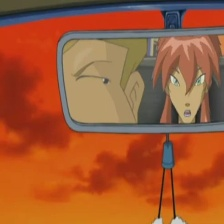

Frame: /content/new_resized_frames/frame3580.jpg
Prediction: Non-violent
Probability: [0.65802144 0.34197856]


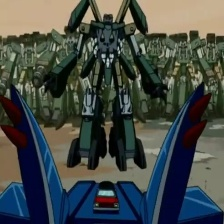

Frame: /content/new_resized_frames/frame680.jpg
Prediction: Non-violent
Probability: [0.64269752 0.35730248]


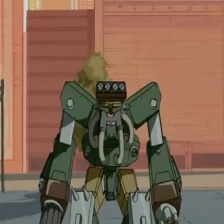

Frame: /content/new_resized_frames/frame3340.jpg
Prediction: Non-violent
Probability: [0.68608427 0.31391573]


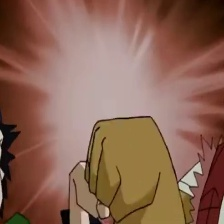

Frame: /content/new_resized_frames/frame4690.jpg
Prediction: Non-violent
Probability: [0.56744586 0.43255414]


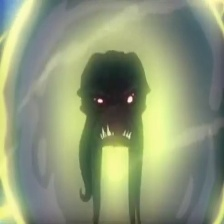

Frame: /content/new_resized_frames/frame1000.jpg
Prediction: Non-violent
Probability: [0.55162373 0.44837627]


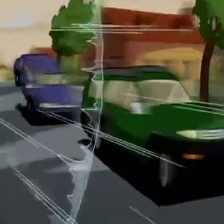

Frame: /content/new_resized_frames/frame2430.jpg
Prediction: Non-violent
Probability: [0.65501941 0.34498059]


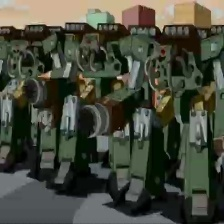

Frame: /content/new_resized_frames/frame640.jpg
Prediction: Non-violent
Probability: [0.56505638 0.43494362]


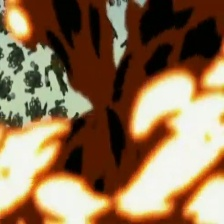

Frame: /content/new_resized_frames/frame2700.jpg
Prediction: Non-violent
Probability: [0.5 0.5]


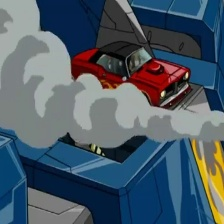

Frame: /content/new_resized_frames/frame1770.jpg
Prediction: Non-violent
Probability: [0.66360111 0.33639889]


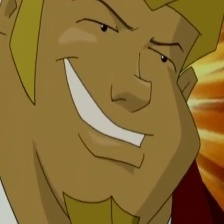

Frame: /content/new_resized_frames/frame1520.jpg
Prediction: Non-violent
Probability: [0.55146827 0.44853173]


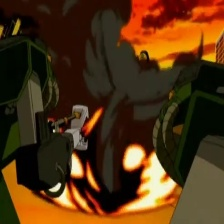

Frame: /content/new_resized_frames/frame4450.jpg
Prediction: Non-violent
Probability: [0.49456396 0.50543604]


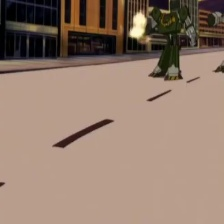

Frame: /content/new_resized_frames/frame4100.jpg
Prediction: Non-violent
Probability: [0.70308244 0.29691756]


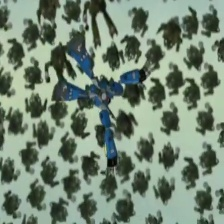

Frame: /content/new_resized_frames/frame2670.jpg
Prediction: Non-violent
Probability: [0.68629596 0.31370404]


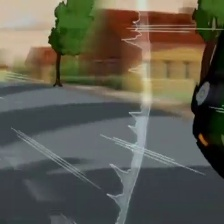

Frame: /content/new_resized_frames/frame2450.jpg
Prediction: Non-violent
Probability: [0.63029422 0.36970578]


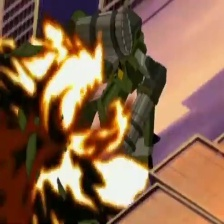

Frame: /content/new_resized_frames/frame3980.jpg
Prediction: Non-violent
Probability: [0.52680041 0.47319959]


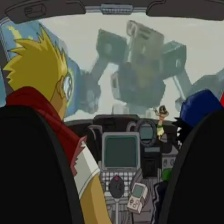

Frame: /content/new_resized_frames/frame2970.jpg
Prediction: Non-violent
Probability: [0.68264326 0.31735674]


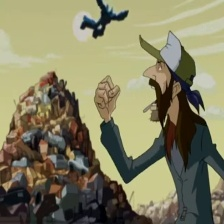

Frame: /content/new_resized_frames/frame3050.jpg
Prediction: Non-violent
Probability: [0.5 0.5]


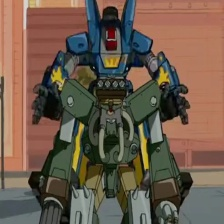

Frame: /content/new_resized_frames/frame3350.jpg
Prediction: Non-violent
Probability: [0.66030369 0.33969631]


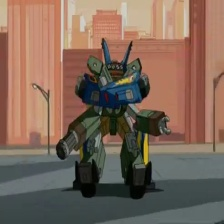

Frame: /content/new_resized_frames/frame3400.jpg
Prediction: Non-violent
Probability: [0.71695943 0.28304057]


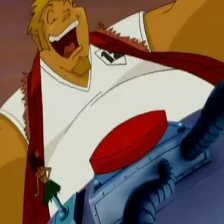

Frame: /content/new_resized_frames/frame4270.jpg
Prediction: Non-violent
Probability: [0.73977257 0.26022743]


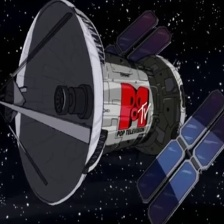

Frame: /content/new_resized_frames/frame2100.jpg
Prediction: Non-violent
Probability: [0.69930786 0.30069214]


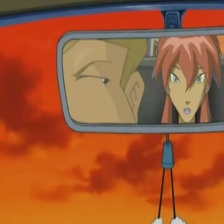

Frame: /content/new_resized_frames/frame3450.jpg
Prediction: Non-violent
Probability: [0.68092209 0.31907791]


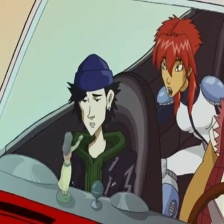

Frame: /content/new_resized_frames/frame240.jpg
Prediction: Non-violent
Probability: [0.6574616 0.3425384]


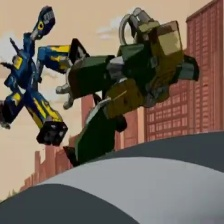

Frame: /content/new_resized_frames/frame4040.jpg
Prediction: Non-violent
Probability: [0.73582687 0.26417313]


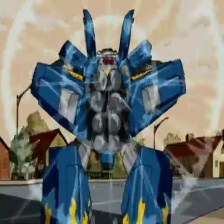

Frame: /content/new_resized_frames/frame2320.jpg
Prediction: Non-violent
Probability: [0.67792486 0.32207514]


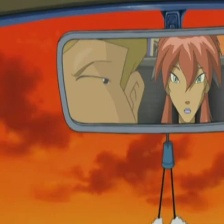

Frame: /content/new_resized_frames/frame3550.jpg
Prediction: Non-violent
Probability: [0.67001582 0.32998418]


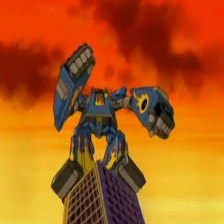

Frame: /content/new_resized_frames/frame3730.jpg
Prediction: Non-violent
Probability: [0.68128849 0.31871151]


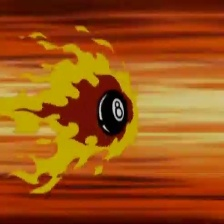

Frame: /content/new_resized_frames/frame3960.jpg
Prediction: Non-violent
Probability: [0.66017151 0.33982849]


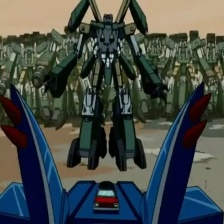

Frame: /content/new_resized_frames/frame690.jpg
Prediction: Non-violent
Probability: [0.64242565 0.35757435]


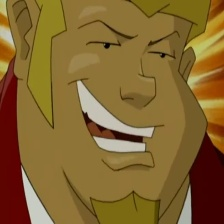

Frame: /content/new_resized_frames/frame1440.jpg
Prediction: Non-violent
Probability: [0.56535923 0.43464077]


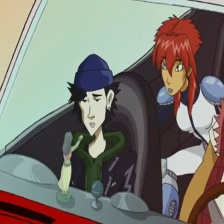

Frame: /content/new_resized_frames/frame200.jpg
Prediction: Non-violent
Probability: [0.65954918 0.34045082]


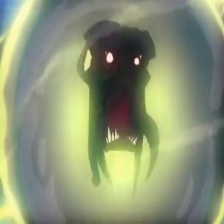

Frame: /content/new_resized_frames/frame1060.jpg
Prediction: Non-violent
Probability: [0.52879094 0.47120906]


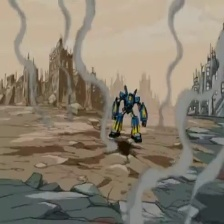

Frame: /content/new_resized_frames/frame4490.jpg
Prediction: Non-violent
Probability: [0.54631658 0.45368342]


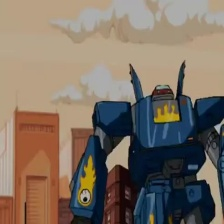

Frame: /content/new_resized_frames/frame3680.jpg
Prediction: Non-violent
Probability: [0.69322256 0.30677744]


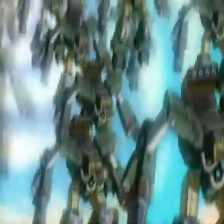

Frame: /content/new_resized_frames/frame370.jpg
Prediction: Non-violent
Probability: [0.43883951 0.56116049]


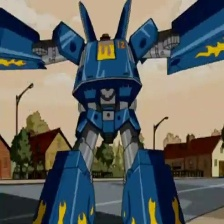

Frame: /content/new_resized_frames/frame2300.jpg
Prediction: Non-violent
Probability: [0.71002855 0.28997145]


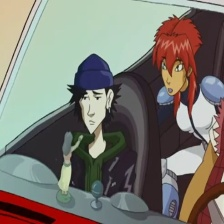

Frame: /content/new_resized_frames/frame120.jpg
Prediction: Non-violent
Probability: [0.66350206 0.33649794]


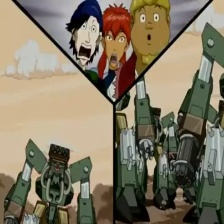

Frame: /content/new_resized_frames/frame490.jpg
Prediction: Non-violent
Probability: [0.74645257 0.25354743]


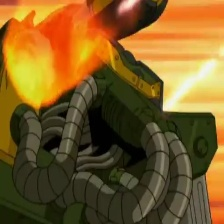

Frame: /content/new_resized_frames/frame3230.jpg
Prediction: Non-violent
Probability: [0.63521561 0.36478439]


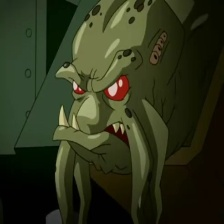

Frame: /content/new_resized_frames/frame3800.jpg
Prediction: Violent
Probability: [0.39266392 0.60733608]


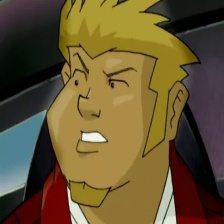

Frame: /content/new_resized_frames/frame1290.jpg
Prediction: Non-violent
Probability: [0.6702576 0.3297424]


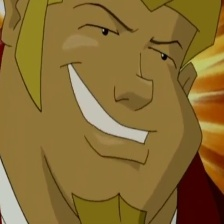

Frame: /content/new_resized_frames/frame1500.jpg
Prediction: Non-violent
Probability: [0.52765594 0.47234406]


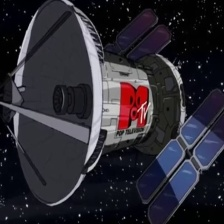

Frame: /content/new_resized_frames/frame2110.jpg
Prediction: Non-violent
Probability: [0.70395077 0.29604923]


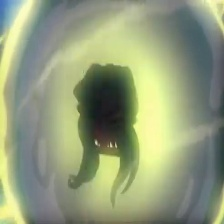

Frame: /content/new_resized_frames/frame1080.jpg
Prediction: Non-violent
Probability: [0.50650257 0.49349743]


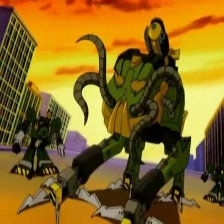

Frame: /content/new_resized_frames/frame4390.jpg
Prediction: Non-violent
Probability: [0.57018105 0.42981895]


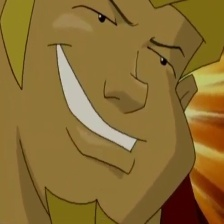

Frame: /content/new_resized_frames/frame1560.jpg
Prediction: Non-violent
Probability: [0.59129809 0.40870191]


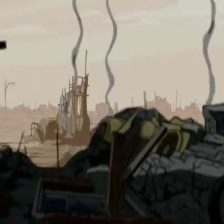

Frame: /content/new_resized_frames/frame4530.jpg
Prediction: Non-violent
Probability: [0.57616693 0.42383307]


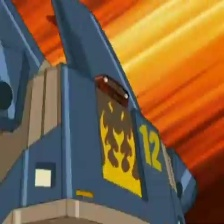

Frame: /content/new_resized_frames/frame4200.jpg
Prediction: Non-violent
Probability: [0.66090001 0.33909999]


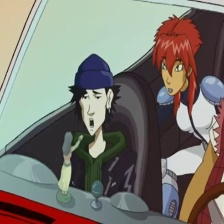

Frame: /content/new_resized_frames/frame140.jpg
Prediction: Non-violent
Probability: [0.66970351 0.33029649]


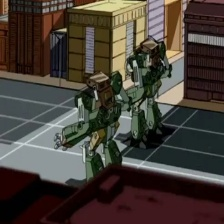

Frame: /content/new_resized_frames/frame3150.jpg
Prediction: Non-violent
Probability: [0.72708281 0.27291719]


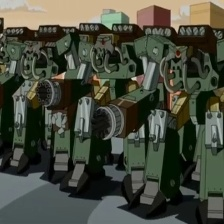

Frame: /content/new_resized_frames/frame620.jpg
Prediction: Non-violent
Probability: [0.58923867 0.41076133]


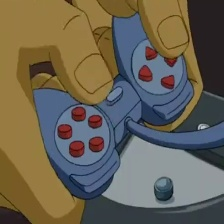

Frame: /content/new_resized_frames/frame2790.jpg
Prediction: Non-violent
Probability: [0.60393804 0.39606196]


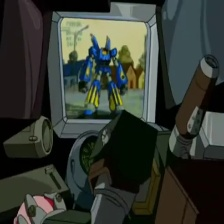

Frame: /content/new_resized_frames/frame760.jpg
Prediction: Non-violent
Probability: [0.63585458 0.36414542]


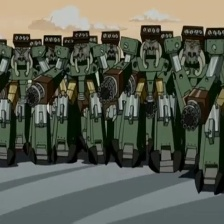

Frame: /content/new_resized_frames/frame530.jpg
Prediction: Non-violent
Probability: [0.61996599 0.38003401]


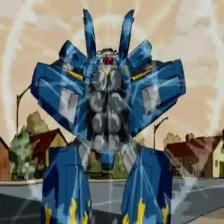

Frame: /content/new_resized_frames/frame2330.jpg
Prediction: Non-violent
Probability: [0.68047229 0.31952771]


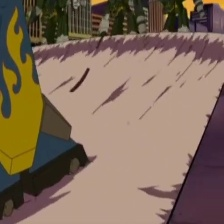

Frame: /content/new_resized_frames/frame4140.jpg
Prediction: Non-violent
Probability: [0.65341627 0.34658373]


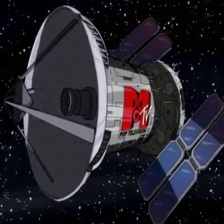

Frame: /content/new_resized_frames/frame2050.jpg
Prediction: Non-violent
Probability: [0.70415707 0.29584293]


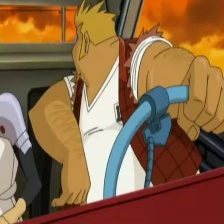

Frame: /content/new_resized_frames/frame3270.jpg
Prediction: Non-violent
Probability: [0.67052593 0.32947407]


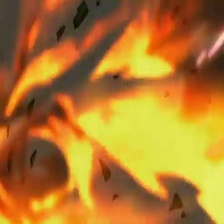

Frame: /content/new_resized_frames/frame3240.jpg
Prediction: Non-violent
Probability: [0.44066852 0.55933148]


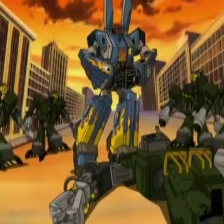

Frame: /content/new_resized_frames/frame2930.jpg
Prediction: Non-violent
Probability: [0.61545811 0.38454189]


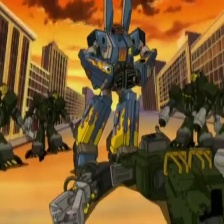

Frame: /content/new_resized_frames/frame2920.jpg
Prediction: Non-violent
Probability: [0.6161516 0.3838484]


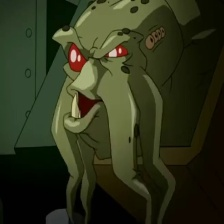

Frame: /content/new_resized_frames/frame3870.jpg
Prediction: Violent
Probability: [0.40724187 0.59275813]


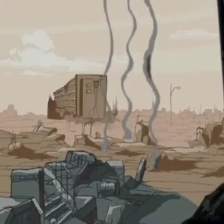

Frame: /content/new_resized_frames/frame4620.jpg
Prediction: Non-violent
Probability: [0.64602308 0.35397692]


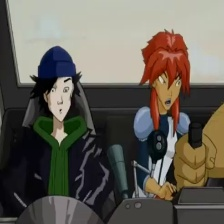

Frame: /content/new_resized_frames/frame2560.jpg
Prediction: Non-violent
Probability: [0.72409943 0.27590057]


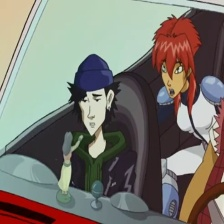

Frame: /content/new_resized_frames/frame210.jpg
Prediction: Non-violent
Probability: [0.66210096 0.33789904]


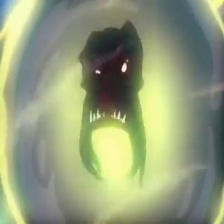

Frame: /content/new_resized_frames/frame950.jpg
Prediction: Non-violent
Probability: [0.57051571 0.42948429]


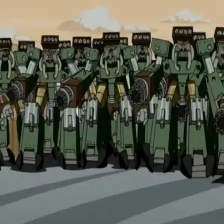

Frame: /content/new_resized_frames/frame510.jpg
Prediction: Non-violent
Probability: [0.65543277 0.34456723]


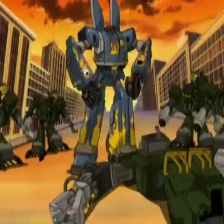

Frame: /content/new_resized_frames/frame2910.jpg
Prediction: Non-violent
Probability: [0.60077168 0.39922832]


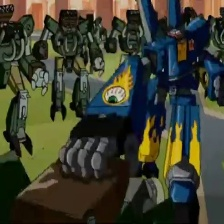

Frame: /content/new_resized_frames/frame2740.jpg
Prediction: Non-violent
Probability: [0.56402418 0.43597582]


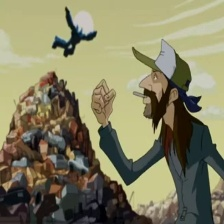

Frame: /content/new_resized_frames/frame3040.jpg
Prediction: Non-violent
Probability: [0.52662735 0.47337265]


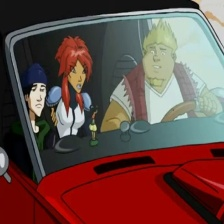

Frame: /content/new_resized_frames/frame1700.jpg
Prediction: Non-violent
Probability: [0.69326945 0.30673055]


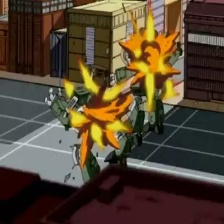

Frame: /content/new_resized_frames/frame3170.jpg
Prediction: Non-violent
Probability: [0.63809851 0.36190149]


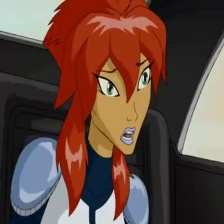

Frame: /content/new_resized_frames/frame1170.jpg
Prediction: Non-violent
Probability: [0.70029946 0.29970054]


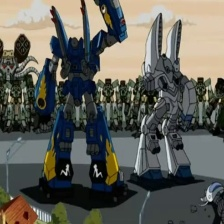

Frame: /content/new_resized_frames/frame1340.jpg
Prediction: Non-violent
Probability: [0.66097346 0.33902654]


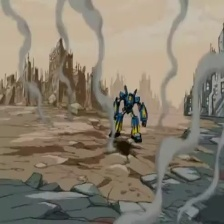

Frame: /content/new_resized_frames/frame4480.jpg
Prediction: Non-violent
Probability: [0.55416772 0.44583228]


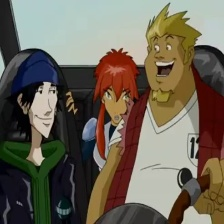

Frame: /content/new_resized_frames/frame4640.jpg
Prediction: Non-violent
Probability: [0.63902105 0.36097895]


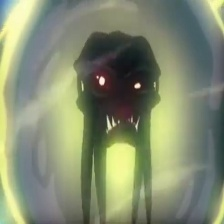

Frame: /content/new_resized_frames/frame1030.jpg
Prediction: Non-violent
Probability: [0.5987933 0.4012067]


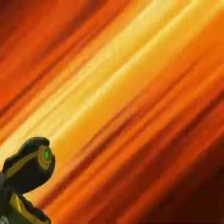

Frame: /content/new_resized_frames/frame3190.jpg
Prediction: Non-violent
Probability: [0.6877204 0.3122796]


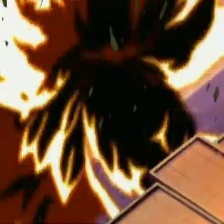

Frame: /content/new_resized_frames/frame3990.jpg
Prediction: Non-violent
Probability: [0.58740221 0.41259779]


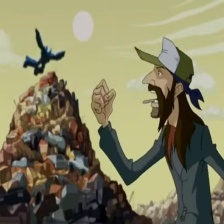

Frame: /content/new_resized_frames/frame3030.jpg
Prediction: Non-violent
Probability: [0.54248203 0.45751797]


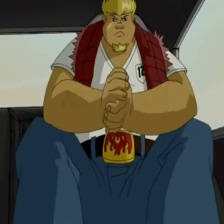

Frame: /content/new_resized_frames/frame2270.jpg
Prediction: Non-violent
Probability: [0.71022636 0.28977364]


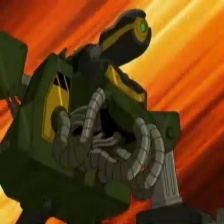

Frame: /content/new_resized_frames/frame3210.jpg
Prediction: Non-violent
Probability: [0.58009717 0.41990283]


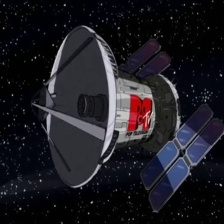

Frame: /content/new_resized_frames/frame1900.jpg
Prediction: Non-violent
Probability: [0.70853423 0.29146577]


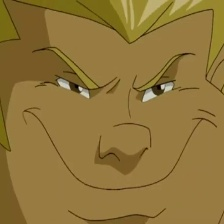

Frame: /content/new_resized_frames/frame2480.jpg
Prediction: Non-violent
Probability: [0.53219101 0.46780899]


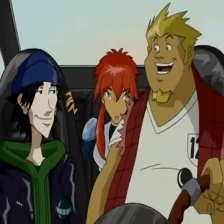

Frame: /content/new_resized_frames/frame4660.jpg
Prediction: Non-violent
Probability: [0.65228986 0.34771014]


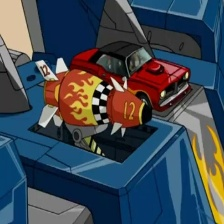

Frame: /content/new_resized_frames/frame1740.jpg
Prediction: Non-violent
Probability: [0.68931004 0.31068996]


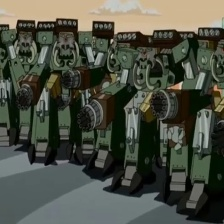

Frame: /content/new_resized_frames/frame580.jpg
Prediction: Non-violent
Probability: [0.66768394 0.33231606]


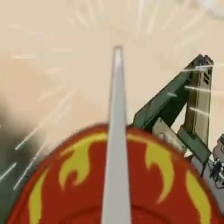

Frame: /content/new_resized_frames/frame1800.jpg
Prediction: Non-violent
Probability: [0.64701845 0.35298155]


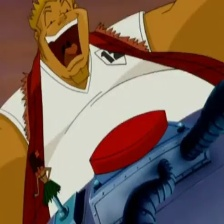

Frame: /content/new_resized_frames/frame4280.jpg
Prediction: Non-violent
Probability: [0.74221954 0.25778046]


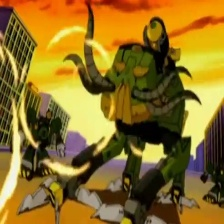

Frame: /content/new_resized_frames/frame4370.jpg
Prediction: Non-violent
Probability: [0.47148064 0.52851936]


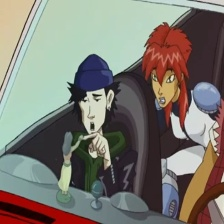

Frame: /content/new_resized_frames/frame300.jpg
Prediction: Non-violent
Probability: [0.67937357 0.32062643]


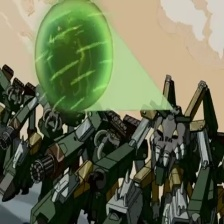

Frame: /content/new_resized_frames/frame930.jpg
Prediction: Non-violent
Probability: [0.67037781 0.32962219]


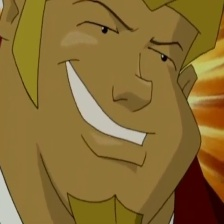

Frame: /content/new_resized_frames/frame1510.jpg
Prediction: Non-violent
Probability: [0.53923185 0.46076815]


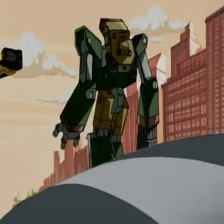

Frame: /content/new_resized_frames/frame4030.jpg
Prediction: Non-violent
Probability: [0.71233667 0.28766333]


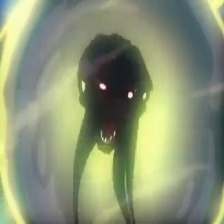

Frame: /content/new_resized_frames/frame1050.jpg
Prediction: Non-violent
Probability: [0.59282922 0.40717078]


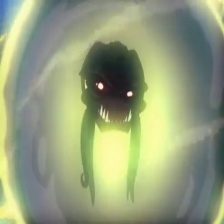

Frame: /content/new_resized_frames/frame1140.jpg
Prediction: Non-violent
Probability: [0.56194755 0.43805245]


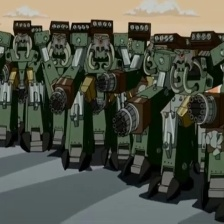

Frame: /content/new_resized_frames/frame570.jpg
Prediction: Non-violent
Probability: [0.57449904 0.42550096]


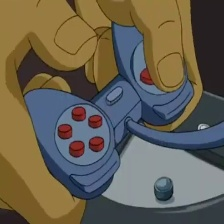

Frame: /content/new_resized_frames/frame2800.jpg
Prediction: Non-violent
Probability: [0.56197809 0.43802191]


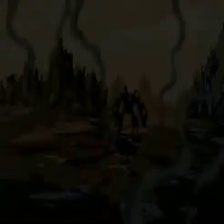

Frame: /content/new_resized_frames/frame4470.jpg
Prediction: Non-violent
Probability: [0.47926535 0.52073465]


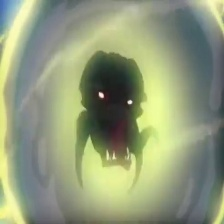

Frame: /content/new_resized_frames/frame1100.jpg
Prediction: Non-violent
Probability: [0.58395756 0.41604244]


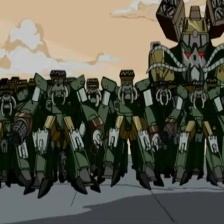

Frame: /content/new_resized_frames/frame1190.jpg
Prediction: Non-violent
Probability: [0.52803676 0.47196324]


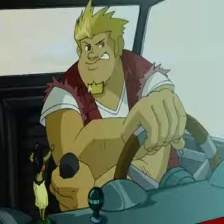

Frame: /content/new_resized_frames/frame4000.jpg
Prediction: Non-violent
Probability: [0.68292824 0.31707176]


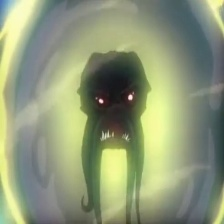

Frame: /content/new_resized_frames/frame1010.jpg
Prediction: Non-violent
Probability: [0.57852264 0.42147736]


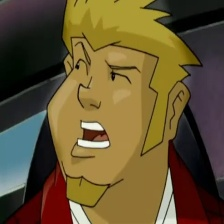

Frame: /content/new_resized_frames/frame1260.jpg
Prediction: Non-violent
Probability: [0.6915007 0.3084993]


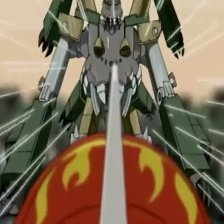

Frame: /content/new_resized_frames/frame1790.jpg
Prediction: Non-violent
Probability: [0.52323596 0.47676404]


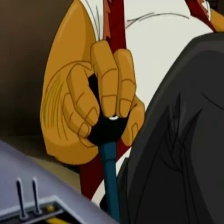

Frame: /content/new_resized_frames/frame3720.jpg
Prediction: Non-violent
Probability: [0.65456741 0.34543259]


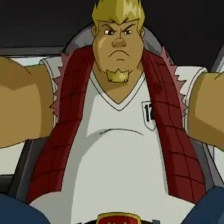

Frame: /content/new_resized_frames/frame2250.jpg
Prediction: Non-violent
Probability: [0.740798 0.259202]


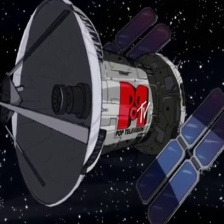

Frame: /content/new_resized_frames/frame2120.jpg
Prediction: Non-violent
Probability: [0.69591903 0.30408097]


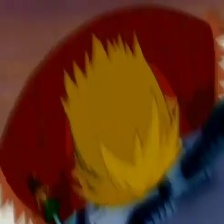

Frame: /content/new_resized_frames/frame4310.jpg
Prediction: Non-violent
Probability: [0.56965076 0.43034924]


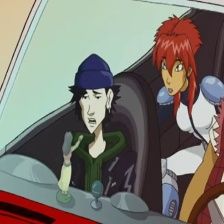

Frame: /content/new_resized_frames/frame150.jpg
Prediction: Non-violent
Probability: [0.66941367 0.33058633]


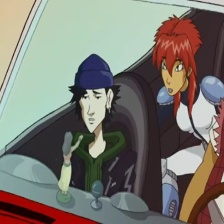

Frame: /content/new_resized_frames/frame100.jpg
Prediction: Non-violent
Probability: [0.66561303 0.33438697]


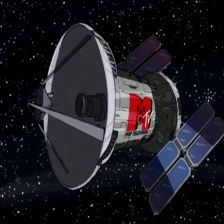

Frame: /content/new_resized_frames/frame1920.jpg
Prediction: Non-violent
Probability: [0.71476443 0.28523557]


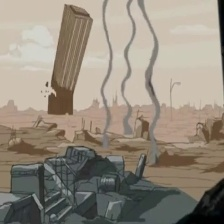

Frame: /content/new_resized_frames/frame4610.jpg
Prediction: Non-violent
Probability: [0.59927097 0.40072903]


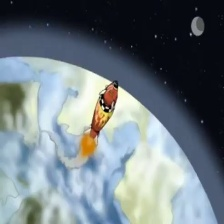

Frame: /content/new_resized_frames/frame2170.jpg
Prediction: Non-violent
Probability: [0.52311541 0.47688459]


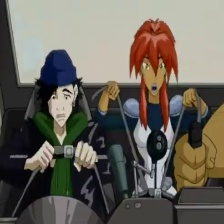

Frame: /content/new_resized_frames/frame2580.jpg
Prediction: Non-violent
Probability: [0.70607192 0.29392808]


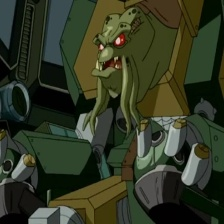

Frame: /content/new_resized_frames/frame890.jpg
Prediction: Non-violent
Probability: [0.51275965 0.48724035]


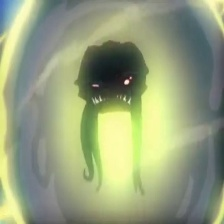

Frame: /content/new_resized_frames/frame980.jpg
Prediction: Non-violent
Probability: [0.56834734 0.43165266]


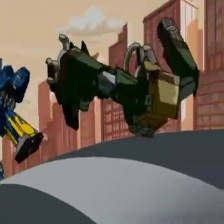

Frame: /content/new_resized_frames/frame4050.jpg
Prediction: Non-violent
Probability: [0.75479458 0.24520542]


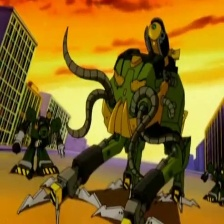

Frame: /content/new_resized_frames/frame4380.jpg
Prediction: Non-violent
Probability: [0.57839044 0.42160956]


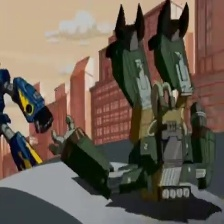

Frame: /content/new_resized_frames/frame4060.jpg
Prediction: Non-violent
Probability: [0.63600101 0.36399899]


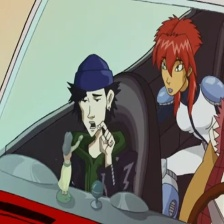

Frame: /content/new_resized_frames/frame280.jpg
Prediction: Non-violent
Probability: [0.65903717 0.34096283]


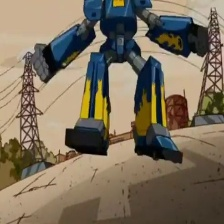

Frame: /content/new_resized_frames/frame3320.jpg
Prediction: Non-violent
Probability: [0.62809839 0.37190161]


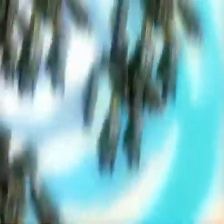

Frame: /content/new_resized_frames/frame350.jpg
Prediction: Non-violent
Probability: [0.55217052 0.44782948]


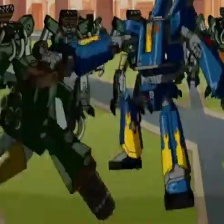

Frame: /content/new_resized_frames/frame2750.jpg
Prediction: Non-violent
Probability: [0.54520909 0.45479091]


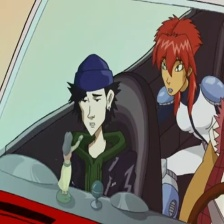

Frame: /content/new_resized_frames/frame220.jpg
Prediction: Non-violent
Probability: [0.65698869 0.34301131]


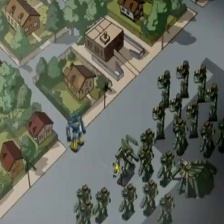

Frame: /content/new_resized_frames/frame1820.jpg
Prediction: Non-violent
Probability: [0.69290234 0.30709766]


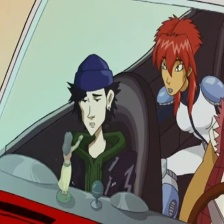

Frame: /content/new_resized_frames/frame260.jpg
Prediction: Non-violent
Probability: [0.66359591 0.33640409]


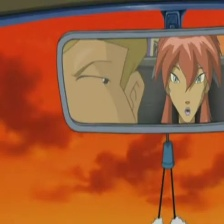

Frame: /content/new_resized_frames/frame3500.jpg
Prediction: Non-violent
Probability: [0.6723345 0.3276655]


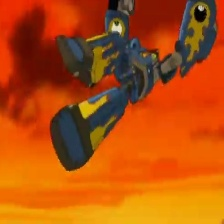

Frame: /content/new_resized_frames/frame3760.jpg
Prediction: Non-violent
Probability: [0.62426787 0.37573213]


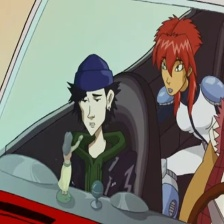

Frame: /content/new_resized_frames/frame250.jpg
Prediction: Non-violent
Probability: [0.66379274 0.33620726]


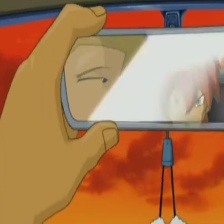

Frame: /content/new_resized_frames/frame3630.jpg
Prediction: Non-violent
Probability: [0.68669921 0.31330079]


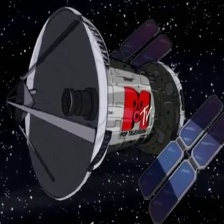

Frame: /content/new_resized_frames/frame2040.jpg
Prediction: Non-violent
Probability: [0.70787819 0.29212181]


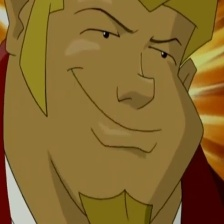

Frame: /content/new_resized_frames/frame1480.jpg
Prediction: Non-violent
Probability: [0.50615398 0.49384602]


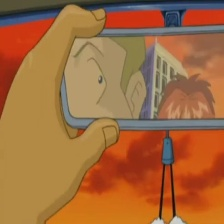

Frame: /content/new_resized_frames/frame3640.jpg
Prediction: Non-violent
Probability: [0.64053658 0.35946342]


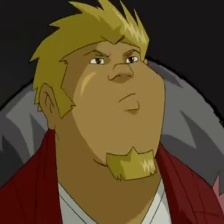

Frame: /content/new_resized_frames/frame2220.jpg
Prediction: Non-violent
Probability: [0.67943745 0.32056255]


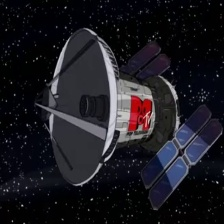

Frame: /content/new_resized_frames/frame1880.jpg
Prediction: Non-violent
Probability: [0.70733642 0.29266358]


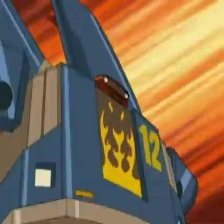

Frame: /content/new_resized_frames/frame4210.jpg
Prediction: Non-violent
Probability: [0.66149164 0.33850836]


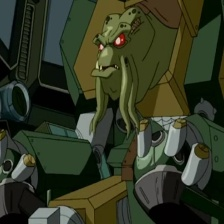

Frame: /content/new_resized_frames/frame880.jpg
Prediction: Non-violent
Probability: [0.5 0.5]


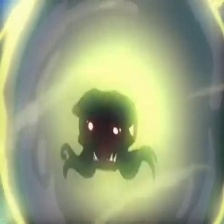

Frame: /content/new_resized_frames/frame1090.jpg
Prediction: Non-violent
Probability: [0.52793026 0.47206974]


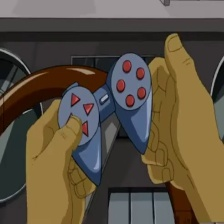

Frame: /content/new_resized_frames/frame3900.jpg
Prediction: Non-violent
Probability: [0.63491248 0.36508752]


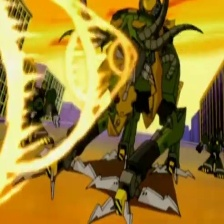

Frame: /content/new_resized_frames/frame4250.jpg
Prediction: Non-violent
Probability: [0.59629353 0.40370647]


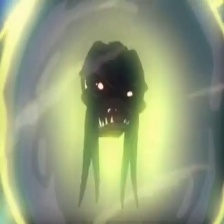

Frame: /content/new_resized_frames/frame1110.jpg
Prediction: Non-violent
Probability: [0.54968087 0.45031913]


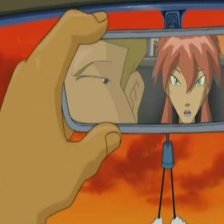

Frame: /content/new_resized_frames/frame3610.jpg
Prediction: Non-violent
Probability: [0.66263518 0.33736482]


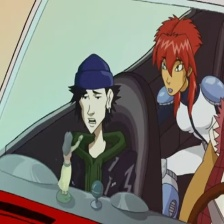

Frame: /content/new_resized_frames/frame130.jpg
Prediction: Non-violent
Probability: [0.6709103 0.3290897]


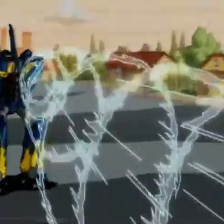

Frame: /content/new_resized_frames/frame2340.jpg
Prediction: Non-violent
Probability: [0.7269264 0.2730736]


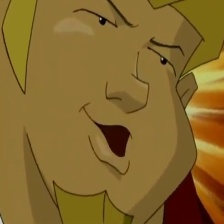

Frame: /content/new_resized_frames/frame1550.jpg
Prediction: Non-violent
Probability: [0.52549967 0.47450033]


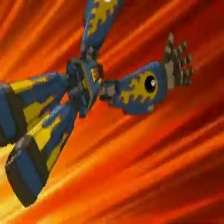

Frame: /content/new_resized_frames/frame3750.jpg
Prediction: Non-violent
Probability: [0.67104618 0.32895382]


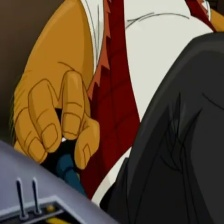

Frame: /content/new_resized_frames/frame3660.jpg
Prediction: Non-violent
Probability: [0.6031123 0.3968877]


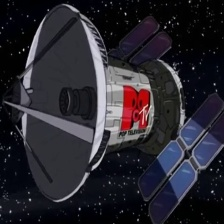

Frame: /content/new_resized_frames/frame2060.jpg
Prediction: Non-violent
Probability: [0.7056984 0.2943016]


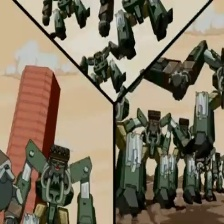

Frame: /content/new_resized_frames/frame470.jpg
Prediction: Non-violent
Probability: [0.65286808 0.34713192]


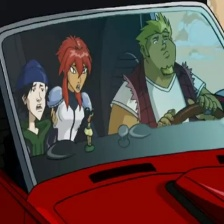

Frame: /content/new_resized_frames/frame710.jpg
Prediction: Non-violent
Probability: [0.677519 0.322481]


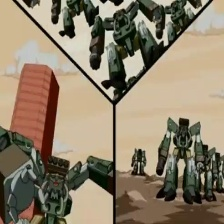

Frame: /content/new_resized_frames/frame460.jpg
Prediction: Non-violent
Probability: [0.69210474 0.30789526]


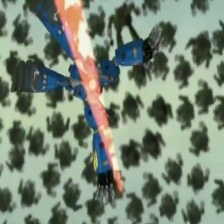

Frame: /content/new_resized_frames/frame2660.jpg
Prediction: Non-violent
Probability: [0.60541928 0.39458072]


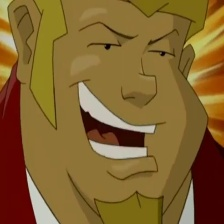

Frame: /content/new_resized_frames/frame1430.jpg
Prediction: Non-violent
Probability: [0.57218179 0.42781821]


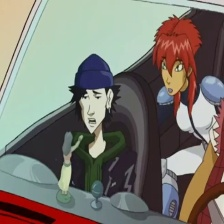

Frame: /content/new_resized_frames/frame20.jpg
Prediction: Non-violent
Probability: [0.66946908 0.33053092]


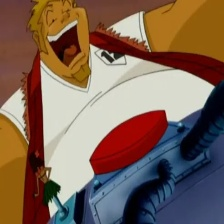

Frame: /content/new_resized_frames/frame4290.jpg
Prediction: Non-violent
Probability: [0.73660476 0.26339524]


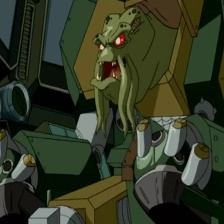

Frame: /content/new_resized_frames/frame870.jpg
Prediction: Non-violent
Probability: [0.51750262 0.48249738]


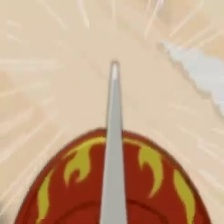

Frame: /content/new_resized_frames/frame1810.jpg
Prediction: Non-violent
Probability: [0.60654277 0.39345723]


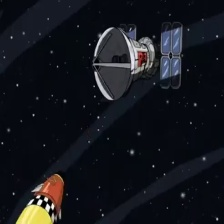

Frame: /content/new_resized_frames/frame2180.jpg
Prediction: Non-violent
Probability: [0.70141833 0.29858167]


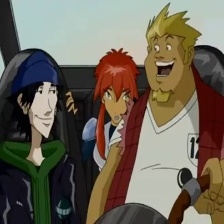

Frame: /content/new_resized_frames/frame4650.jpg
Prediction: Non-violent
Probability: [0.64043294 0.35956706]


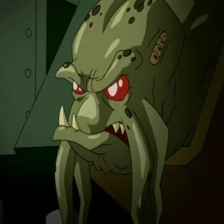

Frame: /content/new_resized_frames/frame3810.jpg
Prediction: Violent
Probability: [0.39596571 0.60403429]


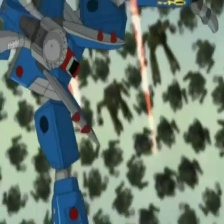

Frame: /content/new_resized_frames/frame2650.jpg
Prediction: Non-violent
Probability: [0.68497474 0.31502526]


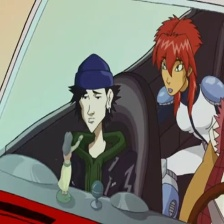

Frame: /content/new_resized_frames/frame180.jpg
Prediction: Non-violent
Probability: [0.6667177 0.3332823]


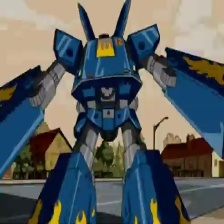

Frame: /content/new_resized_frames/frame2280.jpg
Prediction: Non-violent
Probability: [0.69063522 0.30936478]


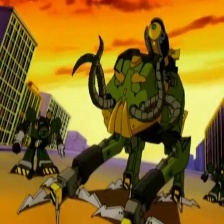

Frame: /content/new_resized_frames/frame4400.jpg
Prediction: Non-violent
Probability: [0.5845024 0.4154976]


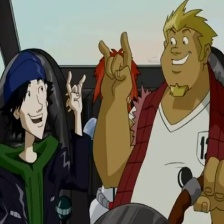

Frame: /content/new_resized_frames/frame4730.jpg
Prediction: Non-violent
Probability: [0.66211642 0.33788358]


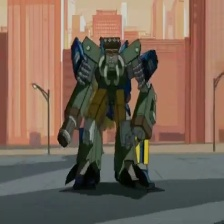

Frame: /content/new_resized_frames/frame3420.jpg
Prediction: Non-violent
Probability: [0.57689912 0.42310088]


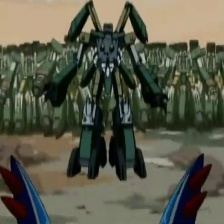

Frame: /content/new_resized_frames/frame670.jpg
Prediction: Non-violent
Probability: [0.58108795 0.41891205]


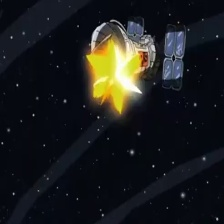

Frame: /content/new_resized_frames/frame2190.jpg
Prediction: Violent
Probability: [0.34534928 0.65465072]


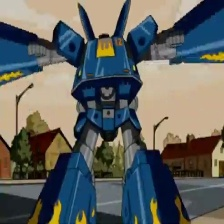

Frame: /content/new_resized_frames/frame2290.jpg
Prediction: Non-violent
Probability: [0.71934558 0.28065442]


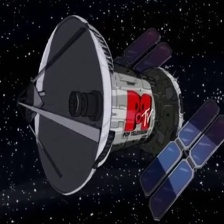

Frame: /content/new_resized_frames/frame1980.jpg
Prediction: Non-violent
Probability: [0.70928683 0.29071317]


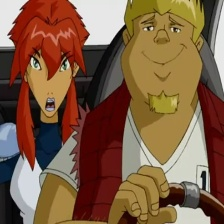

Frame: /content/new_resized_frames/frame1410.jpg
Prediction: Non-violent
Probability: [0.7048402 0.2951598]


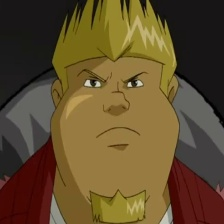

Frame: /content/new_resized_frames/frame2240.jpg
Prediction: Non-violent
Probability: [0.68347618 0.31652382]


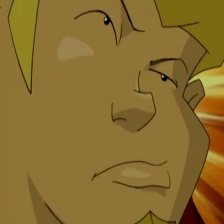

Frame: /content/new_resized_frames/frame1600.jpg
Prediction: Non-violent
Probability: [0.48538903 0.51461097]


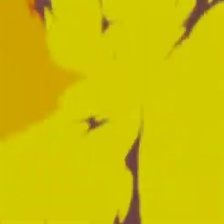

Frame: /content/new_resized_frames/frame4190.jpg
Prediction: Non-violent
Probability: [0.56394346 0.43605654]


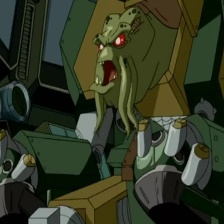

Frame: /content/new_resized_frames/frame850.jpg
Prediction: Non-violent
Probability: [0.49347314 0.50652686]


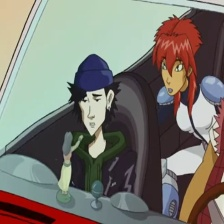

Frame: /content/new_resized_frames/frame190.jpg
Prediction: Non-violent
Probability: [0.65969463 0.34030537]


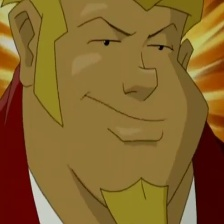

Frame: /content/new_resized_frames/frame1420.jpg
Prediction: Non-violent
Probability: [0.52014997 0.47985003]


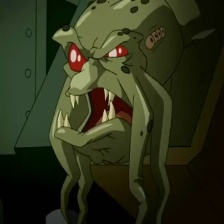

Frame: /content/new_resized_frames/frame3840.jpg
Prediction: Violent
Probability: [0.42483131 0.57516869]


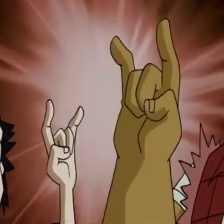

Frame: /content/new_resized_frames/frame4720.jpg
Prediction: Non-violent
Probability: [0.51499259 0.48500741]


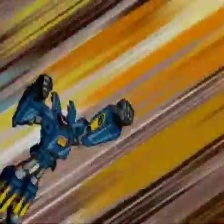

Frame: /content/new_resized_frames/frame4340.jpg
Prediction: Non-violent
Probability: [0.77511163 0.22488837]


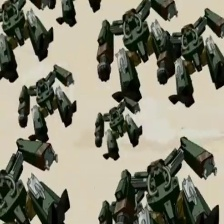

Frame: /content/new_resized_frames/frame430.jpg
Prediction: Non-violent
Probability: [0.4538961 0.5461039]


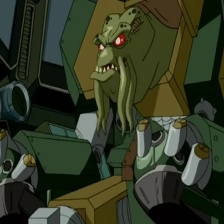

Frame: /content/new_resized_frames/frame900.jpg
Prediction: Non-violent
Probability: [0.51603797 0.48396203]


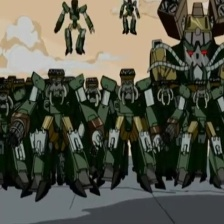

Frame: /content/new_resized_frames/frame1220.jpg
Prediction: Non-violent
Probability: [0.48786527 0.51213473]


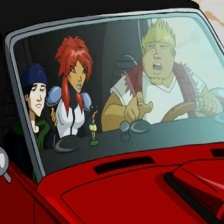

Frame: /content/new_resized_frames/frame1690.jpg
Prediction: Non-violent
Probability: [0.68565682 0.31434318]


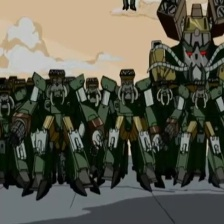

Frame: /content/new_resized_frames/frame1210.jpg
Prediction: Non-violent
Probability: [0.53884687 0.46115313]


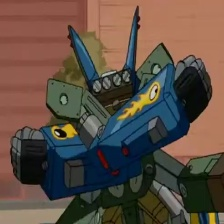

Frame: /content/new_resized_frames/frame3360.jpg
Prediction: Non-violent
Probability: [0.70830125 0.29169875]


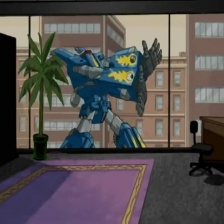

Frame: /content/new_resized_frames/frame3930.jpg
Prediction: Non-violent
Probability: [0.77173254 0.22826746]


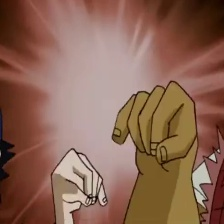

Frame: /content/new_resized_frames/frame4700.jpg
Prediction: Non-violent
Probability: [0.52403143 0.47596857]


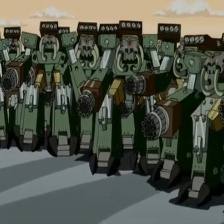

Frame: /content/new_resized_frames/frame560.jpg
Prediction: Non-violent
Probability: [0.54241992 0.45758008]


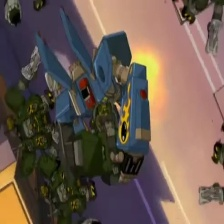

Frame: /content/new_resized_frames/frame2850.jpg
Prediction: Non-violent
Probability: [0.62082356 0.37917644]


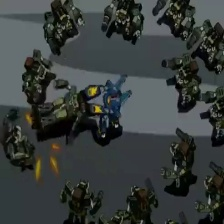

Frame: /content/new_resized_frames/frame2770.jpg
Prediction: Non-violent
Probability: [0.66773634 0.33226366]


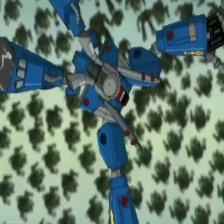

Frame: /content/new_resized_frames/frame2590.jpg
Prediction: Non-violent
Probability: [0.69295335 0.30704665]


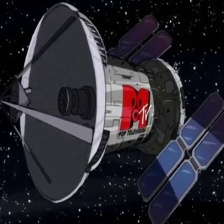

Frame: /content/new_resized_frames/frame2070.jpg
Prediction: Non-violent
Probability: [0.70900232 0.29099768]


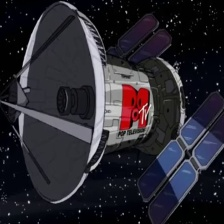

Frame: /content/new_resized_frames/frame2080.jpg
Prediction: Non-violent
Probability: [0.69739364 0.30260636]


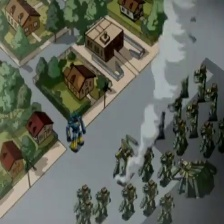

Frame: /content/new_resized_frames/frame1840.jpg
Prediction: Non-violent
Probability: [0.71790143 0.28209857]


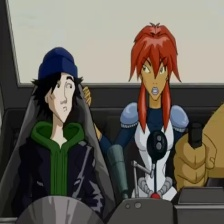

Frame: /content/new_resized_frames/frame2540.jpg
Prediction: Non-violent
Probability: [0.69014228 0.30985772]


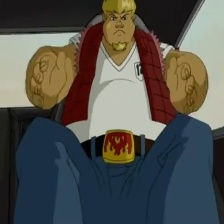

Frame: /content/new_resized_frames/frame2260.jpg
Prediction: Non-violent
Probability: [0.67017666 0.32982334]


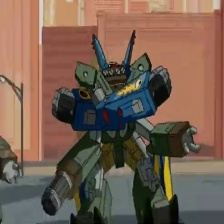

Frame: /content/new_resized_frames/frame3370.jpg
Prediction: Non-violent
Probability: [0.65787815 0.34212185]


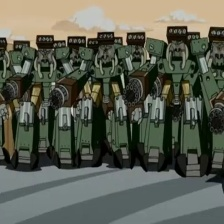

Frame: /content/new_resized_frames/frame520.jpg
Prediction: Non-violent
Probability: [0.64267559 0.35732441]


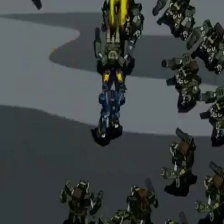

Frame: /content/new_resized_frames/frame2780.jpg
Prediction: Non-violent
Probability: [0.60469832 0.39530168]


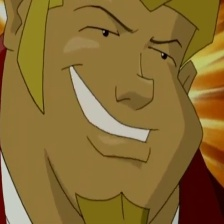

Frame: /content/new_resized_frames/frame1490.jpg
Prediction: Non-violent
Probability: [0.52600467 0.47399533]


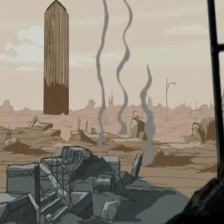

Frame: /content/new_resized_frames/frame4580.jpg
Prediction: Non-violent
Probability: [0.61149365 0.38850635]


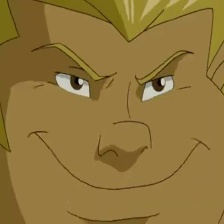

Frame: /content/new_resized_frames/frame2470.jpg
Prediction: Non-violent
Probability: [0.56107017 0.43892983]


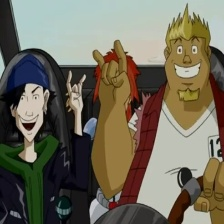

Frame: /content/new_resized_frames/frame4790.jpg
Prediction: Non-violent
Probability: [0.72506778 0.27493222]


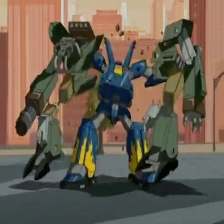

Frame: /content/new_resized_frames/frame3430.jpg
Prediction: Non-violent
Probability: [0.61497324 0.38502676]


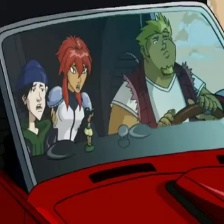

Frame: /content/new_resized_frames/frame700.jpg
Prediction: Non-violent
Probability: [0.67939303 0.32060697]


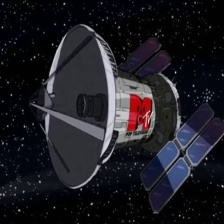

Frame: /content/new_resized_frames/frame1910.jpg
Prediction: Non-violent
Probability: [0.71450562 0.28549438]


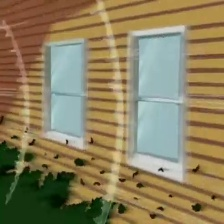

Frame: /content/new_resized_frames/frame2380.jpg
Prediction: Non-violent
Probability: [0.70417383 0.29582617]


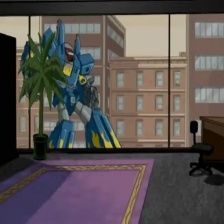

Frame: /content/new_resized_frames/frame3920.jpg
Prediction: Non-violent
Probability: [0.7653327 0.2346673]


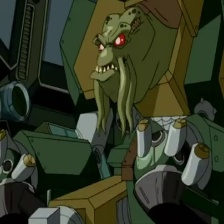

Frame: /content/new_resized_frames/frame770.jpg
Prediction: Non-violent
Probability: [0.51660283 0.48339717]


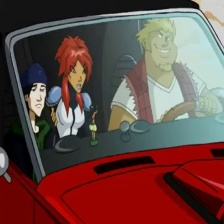

Frame: /content/new_resized_frames/frame1650.jpg
Prediction: Non-violent
Probability: [0.69537972 0.30462028]


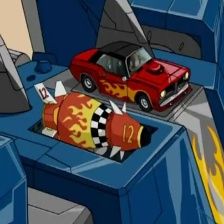

Frame: /content/new_resized_frames/frame1730.jpg
Prediction: Non-violent
Probability: [0.68982658 0.31017342]


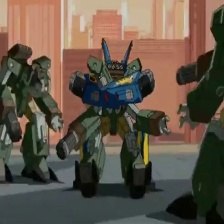

Frame: /content/new_resized_frames/frame3380.jpg
Prediction: Non-violent
Probability: [0.59773696 0.40226304]


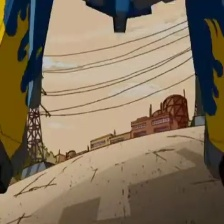

Frame: /content/new_resized_frames/frame3290.jpg
Prediction: Non-violent
Probability: [0.62857291 0.37142709]


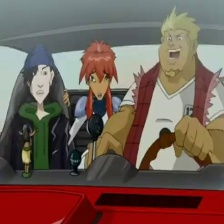

Frame: /content/new_resized_frames/frame4500.jpg
Prediction: Non-violent
Probability: [0.73980011 0.26019989]


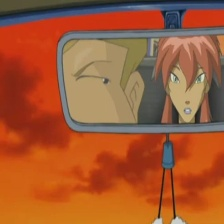

Frame: /content/new_resized_frames/frame3530.jpg
Prediction: Non-violent
Probability: [0.67239156 0.32760844]


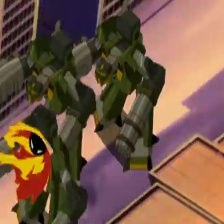

Frame: /content/new_resized_frames/frame3970.jpg
Prediction: Non-violent
Probability: [0.64701344 0.35298656]


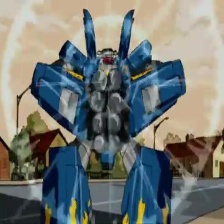

Frame: /content/new_resized_frames/frame2310.jpg
Prediction: Non-violent
Probability: [0.66422663 0.33577337]


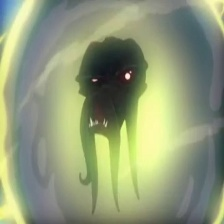

Frame: /content/new_resized_frames/frame960.jpg
Prediction: Non-violent
Probability: [0.57866861 0.42133139]


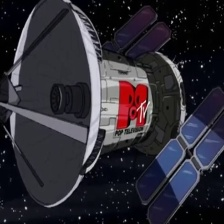

Frame: /content/new_resized_frames/frame2130.jpg
Prediction: Non-violent
Probability: [0.69077452 0.30922548]


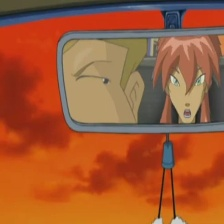

Frame: /content/new_resized_frames/frame3560.jpg
Prediction: Non-violent
Probability: [0.65810888 0.34189112]


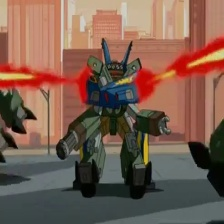

Frame: /content/new_resized_frames/frame3390.jpg
Prediction: Non-violent
Probability: [0.71161481 0.28838519]


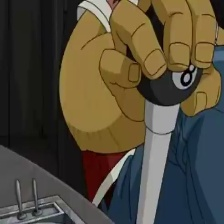

Frame: /content/new_resized_frames/frame2720.jpg
Prediction: Non-violent
Probability: [0.60504798 0.39495202]


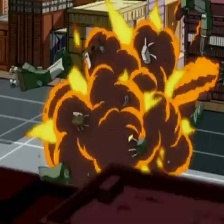

Frame: /content/new_resized_frames/frame3180.jpg
Prediction: Non-violent
Probability: [0.52002232 0.47997768]


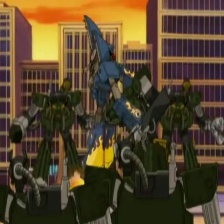

Frame: /content/new_resized_frames/frame2830.jpg
Prediction: Non-violent
Probability: [0.58617033 0.41382967]


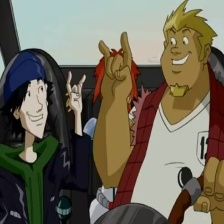

Frame: /content/new_resized_frames/frame4740.jpg
Prediction: Non-violent
Probability: [0.670224 0.329776]


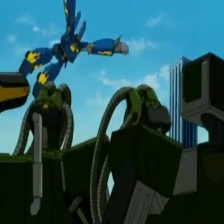

Frame: /content/new_resized_frames/frame2630.jpg
Prediction: Non-violent
Probability: [0.69706012 0.30293988]


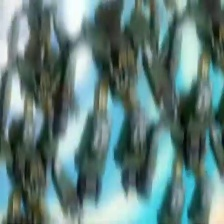

Frame: /content/new_resized_frames/frame360.jpg
Prediction: Non-violent
Probability: [0.47661313 0.52338687]


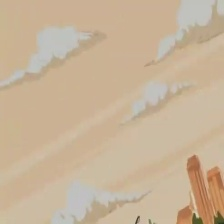

Frame: /content/new_resized_frames/frame2530.jpg
Prediction: Non-violent
Probability: [0.65226029 0.34773971]


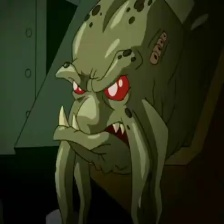

Frame: /content/new_resized_frames/frame3790.jpg
Prediction: Violent
Probability: [0.381739 0.618261]


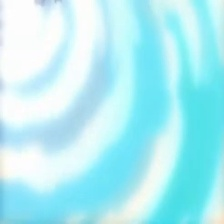

Frame: /content/new_resized_frames/frame330.jpg
Prediction: Non-violent
Probability: [0.51469251 0.48530749]


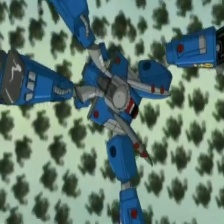

Frame: /content/new_resized_frames/frame2610.jpg
Prediction: Non-violent
Probability: [0.66293501 0.33706499]


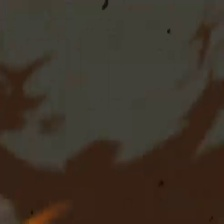

Frame: /content/new_resized_frames/frame3250.jpg
Prediction: Non-violent
Probability: [0.56895932 0.43104068]


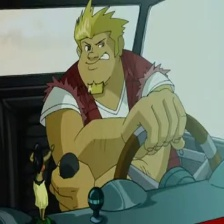

Frame: /content/new_resized_frames/frame4020.jpg
Prediction: Non-violent
Probability: [0.68202577 0.31797423]


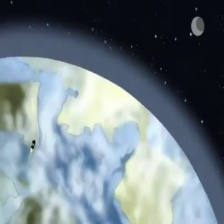

Frame: /content/new_resized_frames/frame2150.jpg
Prediction: Non-violent
Probability: [0.46459421 0.53540579]


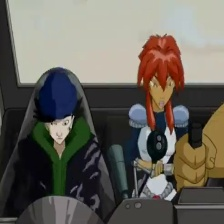

Frame: /content/new_resized_frames/frame2570.jpg
Prediction: Non-violent
Probability: [0.60598466 0.39401534]


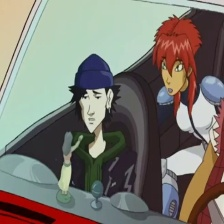

Frame: /content/new_resized_frames/frame30.jpg
Prediction: Non-violent
Probability: [0.66594597 0.33405403]


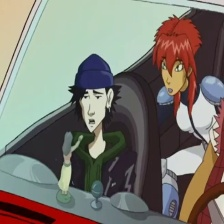

Frame: /content/new_resized_frames/frame40.jpg
Prediction: Non-violent
Probability: [0.66848522 0.33151478]


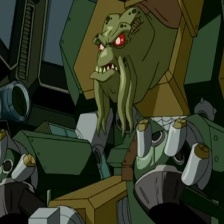

Frame: /content/new_resized_frames/frame910.jpg
Prediction: Non-violent
Probability: [0.51606377 0.48393623]


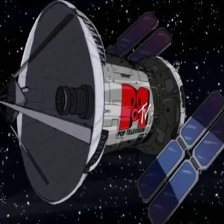

Frame: /content/new_resized_frames/frame2090.jpg
Prediction: Non-violent
Probability: [0.69545713 0.30454287]


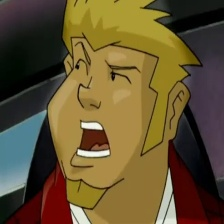

Frame: /content/new_resized_frames/frame1270.jpg
Prediction: Non-violent
Probability: [0.67742672 0.32257328]


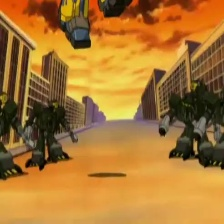

Frame: /content/new_resized_frames/frame2880.jpg
Prediction: Non-violent
Probability: [0.64855518 0.35144482]


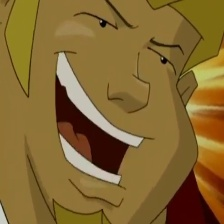

Frame: /content/new_resized_frames/frame1540.jpg
Prediction: Non-violent
Probability: [0.57606732 0.42393268]


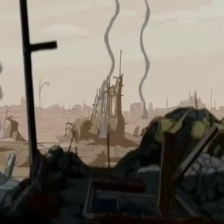

Frame: /content/new_resized_frames/frame4540.jpg
Prediction: Non-violent
Probability: [0.57511848 0.42488152]


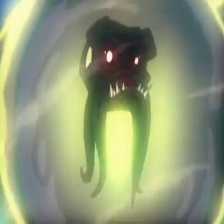

Frame: /content/new_resized_frames/frame1070.jpg
Prediction: Non-violent
Probability: [0.5357774 0.4642226]


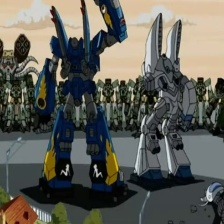

Frame: /content/new_resized_frames/frame1330.jpg
Prediction: Non-violent
Probability: [0.66137443 0.33862557]


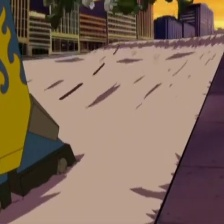

Frame: /content/new_resized_frames/frame4150.jpg
Prediction: Non-violent
Probability: [0.70951906 0.29048094]


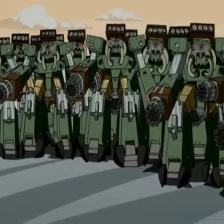

Frame: /content/new_resized_frames/frame540.jpg
Prediction: Non-violent
Probability: [0.59727725 0.40272275]


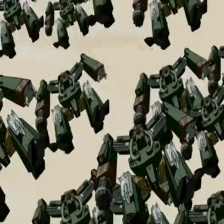

Frame: /content/new_resized_frames/frame420.jpg
Prediction: Non-violent
Probability: [0.47151612 0.52848388]


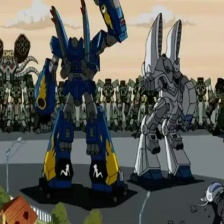

Frame: /content/new_resized_frames/frame1310.jpg
Prediction: Non-violent
Probability: [0.66280586 0.33719414]


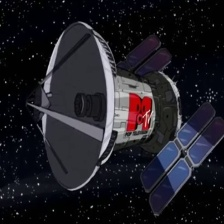

Frame: /content/new_resized_frames/frame1930.jpg
Prediction: Non-violent
Probability: [0.71625126 0.28374874]


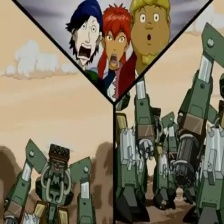

Frame: /content/new_resized_frames/frame500.jpg
Prediction: Non-violent
Probability: [0.74680781 0.25319219]


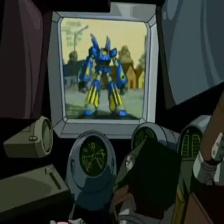

Frame: /content/new_resized_frames/frame750.jpg
Prediction: Non-violent
Probability: [0.6243091 0.3756909]


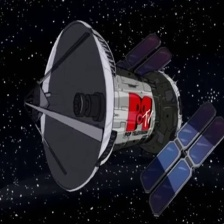

Frame: /content/new_resized_frames/frame1940.jpg
Prediction: Non-violent
Probability: [0.71597532 0.28402468]


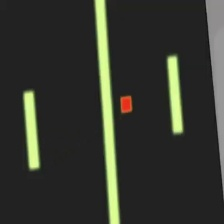

Frame: /content/new_resized_frames/frame2950.jpg
Prediction: Non-violent
Probability: [0.6356529 0.3643471]


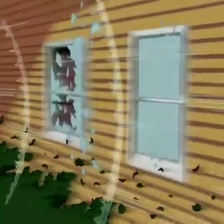

Frame: /content/new_resized_frames/frame2390.jpg
Prediction: Non-violent
Probability: [0.66248356 0.33751644]


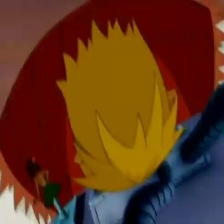

Frame: /content/new_resized_frames/frame4320.jpg
Prediction: Non-violent
Probability: [0.51604995 0.48395005]


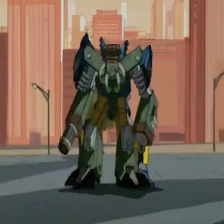

Frame: /content/new_resized_frames/frame3410.jpg
Prediction: Non-violent
Probability: [0.54231739 0.45768261]


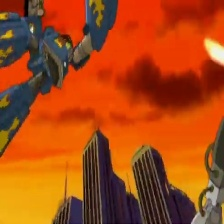

Frame: /content/new_resized_frames/frame3770.jpg
Prediction: Non-violent
Probability: [0.6417498 0.3582502]


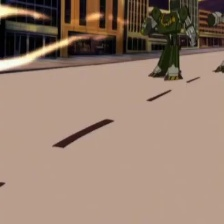

Frame: /content/new_resized_frames/frame4110.jpg
Prediction: Non-violent
Probability: [0.70384865 0.29615135]


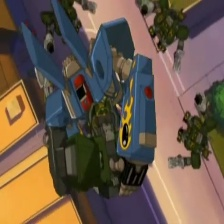

Frame: /content/new_resized_frames/frame2860.jpg
Prediction: Non-violent
Probability: [0.5824964 0.4175036]


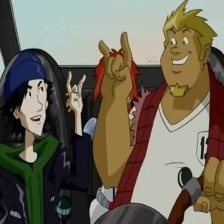

Frame: /content/new_resized_frames/frame4750.jpg
Prediction: Non-violent
Probability: [0.68136011 0.31863989]


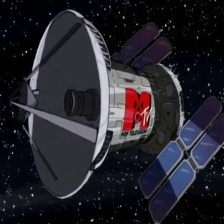

Frame: /content/new_resized_frames/frame2020.jpg
Prediction: Non-violent
Probability: [0.70055205 0.29944795]


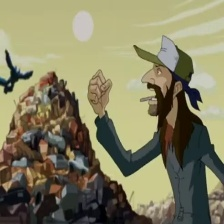

Frame: /content/new_resized_frames/frame3020.jpg
Prediction: Non-violent
Probability: [0.57994783 0.42005217]


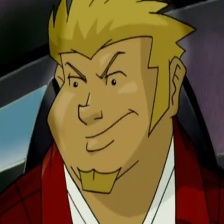

Frame: /content/new_resized_frames/frame1300.jpg
Prediction: Non-violent
Probability: [0.66024789 0.33975211]


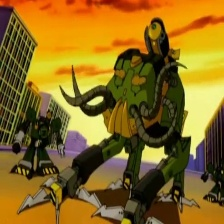

Frame: /content/new_resized_frames/frame4410.jpg
Prediction: Non-violent
Probability: [0.5902356 0.4097644]


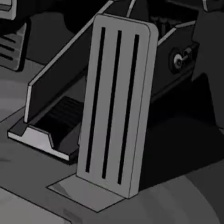

Frame: /content/new_resized_frames/frame4070.jpg
Prediction: Non-violent
Probability: [0.64135909 0.35864091]


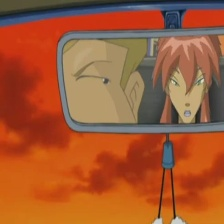

Frame: /content/new_resized_frames/frame3590.jpg
Prediction: Non-violent
Probability: [0.64798828 0.35201172]


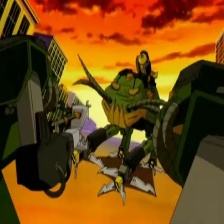

Frame: /content/new_resized_frames/frame4430.jpg
Prediction: Non-violent
Probability: [0.57539959 0.42460041]


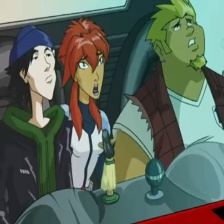

Frame: /content/new_resized_frames/frame1860.jpg
Prediction: Non-violent
Probability: [0.69380184 0.30619816]


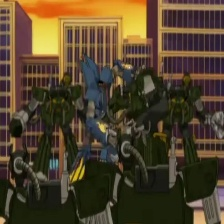

Frame: /content/new_resized_frames/frame2810.jpg
Prediction: Non-violent
Probability: [0.62924949 0.37075051]


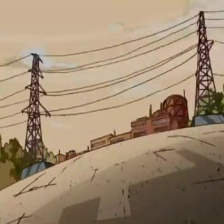

Frame: /content/new_resized_frames/frame3330.jpg
Prediction: Non-violent
Probability: [0.71884969 0.28115031]


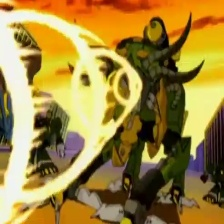

Frame: /content/new_resized_frames/frame4350.jpg
Prediction: Non-violent
Probability: [0.61742302 0.38257698]


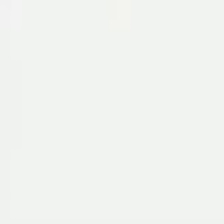

Frame: /content/new_resized_frames/frame3780.jpg
Prediction: Non-violent
Probability: [0.69721039 0.30278961]


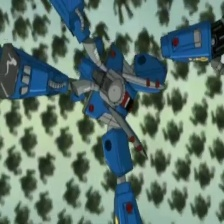

Frame: /content/new_resized_frames/frame2600.jpg
Prediction: Non-violent
Probability: [0.65687826 0.34312174]


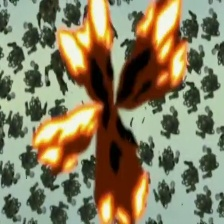

Frame: /content/new_resized_frames/frame2690.jpg
Prediction: Non-violent
Probability: [0.49031131 0.50968869]


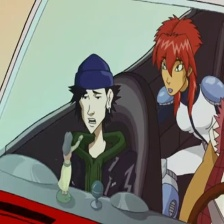

Frame: /content/new_resized_frames/frame160.jpg
Prediction: Non-violent
Probability: [0.67645387 0.32354613]


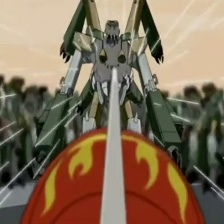

Frame: /content/new_resized_frames/frame1780.jpg
Prediction: Non-violent
Probability: [0.54810976 0.45189024]


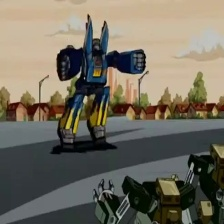

Frame: /content/new_resized_frames/frame2510.jpg
Prediction: Non-violent
Probability: [0.71086299 0.28913701]


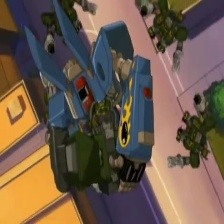

Frame: /content/new_resized_frames/frame2870.jpg
Prediction: Non-violent
Probability: [0.59198369 0.40801631]


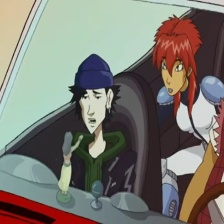

Frame: /content/new_resized_frames/frame90.jpg
Prediction: Non-violent
Probability: [0.66574908 0.33425092]


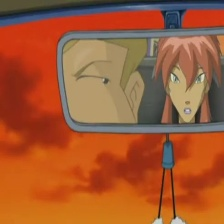

Frame: /content/new_resized_frames/frame3470.jpg
Prediction: Non-violent
Probability: [0.68486296 0.31513704]


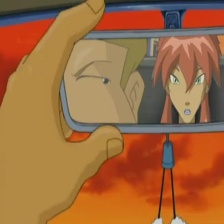

Frame: /content/new_resized_frames/frame3600.jpg
Prediction: Non-violent
Probability: [0.65863762 0.34136238]


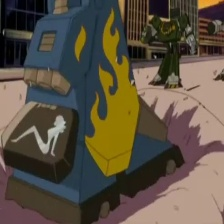

Frame: /content/new_resized_frames/frame4120.jpg
Prediction: Non-violent
Probability: [0.56541244 0.43458756]


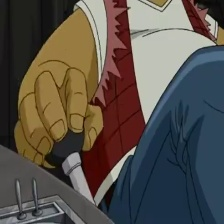

Frame: /content/new_resized_frames/frame2710.jpg
Prediction: Non-violent
Probability: [0.62032459 0.37967541]


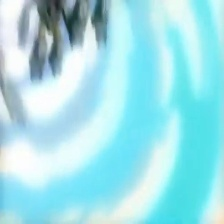

Frame: /content/new_resized_frames/frame340.jpg
Prediction: Non-violent
Probability: [0.47903704 0.52096296]


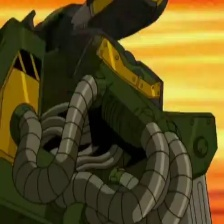

Frame: /content/new_resized_frames/frame3220.jpg
Prediction: Non-violent
Probability: [0.56683992 0.43316008]


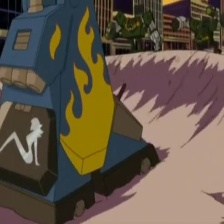

Frame: /content/new_resized_frames/frame4130.jpg
Prediction: Non-violent
Probability: [0.56381132 0.43618868]


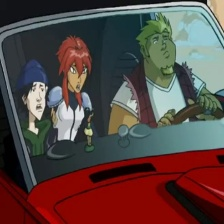

Frame: /content/new_resized_frames/frame720.jpg
Prediction: Non-violent
Probability: [0.67690437 0.32309563]


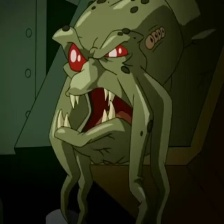

Frame: /content/new_resized_frames/frame3850.jpg
Prediction: Violent
Probability: [0.42474187 0.57525813]


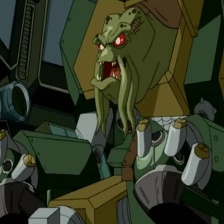

Frame: /content/new_resized_frames/frame840.jpg
Prediction: Non-violent
Probability: [0.51869268 0.48130732]


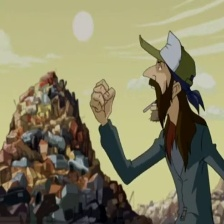

Frame: /content/new_resized_frames/frame3080.jpg
Prediction: Non-violent
Probability: [0.5149018 0.4850982]


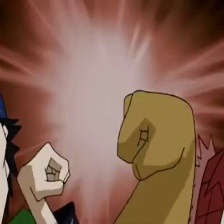

Frame: /content/new_resized_frames/frame4680.jpg
Prediction: Non-violent
Probability: [0.63258199 0.36741801]


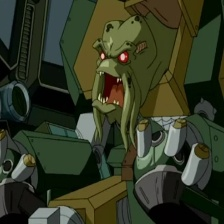

Frame: /content/new_resized_frames/frame810.jpg
Prediction: Non-violent
Probability: [0.52285892 0.47714108]


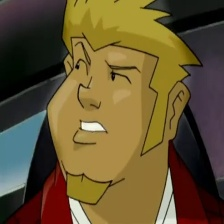

Frame: /content/new_resized_frames/frame1250.jpg
Prediction: Non-violent
Probability: [0.65405122 0.34594878]


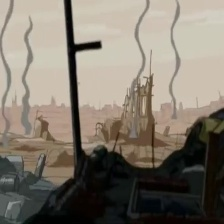

Frame: /content/new_resized_frames/frame4550.jpg
Prediction: Non-violent
Probability: [0.62472986 0.37527014]


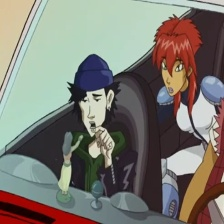

Frame: /content/new_resized_frames/frame290.jpg
Prediction: Non-violent
Probability: [0.67034802 0.32965198]


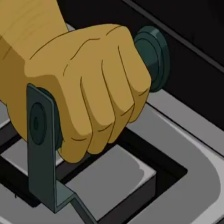

Frame: /content/new_resized_frames/frame1710.jpg
Prediction: Non-violent
Probability: [0.65309834 0.34690166]


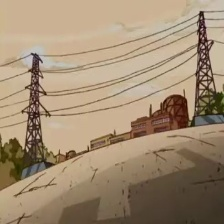

Frame: /content/new_resized_frames/frame3280.jpg
Prediction: Non-violent
Probability: [0.71398154 0.28601846]


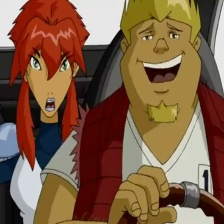

Frame: /content/new_resized_frames/frame1370.jpg
Prediction: Non-violent
Probability: [0.73111622 0.26888378]


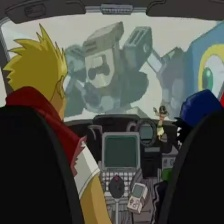

Frame: /content/new_resized_frames/frame2960.jpg
Prediction: Non-violent
Probability: [0.6795191 0.3204809]


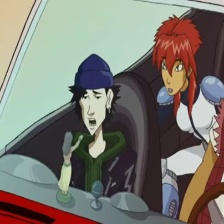

Frame: /content/new_resized_frames/frame110.jpg
Prediction: Non-violent
Probability: [0.68040529 0.31959471]


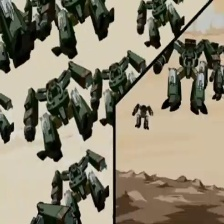

Frame: /content/new_resized_frames/frame440.jpg
Prediction: Non-violent
Probability: [0.58060875 0.41939125]


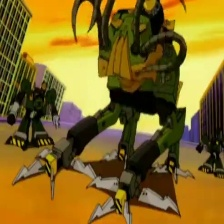

Frame: /content/new_resized_frames/frame4220.jpg
Prediction: Non-violent
Probability: [0.5754613 0.4245387]


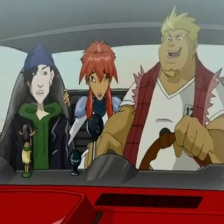

Frame: /content/new_resized_frames/frame4520.jpg
Prediction: Non-violent
Probability: [0.74166277 0.25833723]


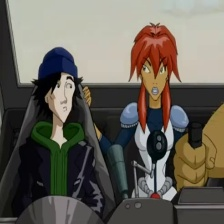

Frame: /content/new_resized_frames/frame2550.jpg
Prediction: Non-violent
Probability: [0.68780599 0.31219401]


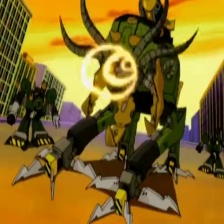

Frame: /content/new_resized_frames/frame4230.jpg
Prediction: Non-violent
Probability: [0.54590836 0.45409164]


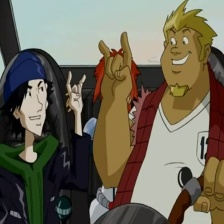

Frame: /content/new_resized_frames/frame4760.jpg
Prediction: Non-violent
Probability: [0.677881 0.322119]


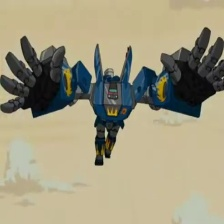

Frame: /content/new_resized_frames/frame3120.jpg
Prediction: Non-violent
Probability: [0.72473807 0.27526193]


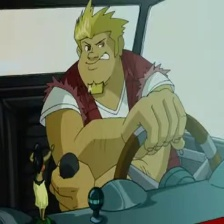

Frame: /content/new_resized_frames/frame4010.jpg
Prediction: Non-violent
Probability: [0.67056137 0.32943863]


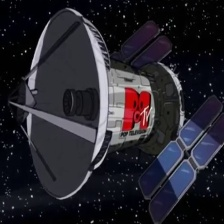

Frame: /content/new_resized_frames/frame2030.jpg
Prediction: Non-violent
Probability: [0.70352777 0.29647223]


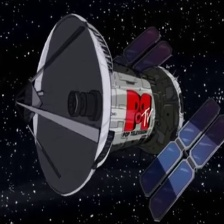

Frame: /content/new_resized_frames/frame1990.jpg
Prediction: Non-violent
Probability: [0.70726586 0.29273414]


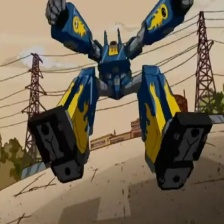

Frame: /content/new_resized_frames/frame3300.jpg
Prediction: Non-violent
Probability: [0.67123228 0.32876772]


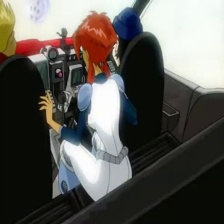

Frame: /content/new_resized_frames/frame390.jpg
Prediction: Non-violent
Probability: [0.6770233 0.3229767]


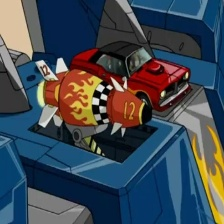

Frame: /content/new_resized_frames/frame1750.jpg
Prediction: Non-violent
Probability: [0.69067006 0.30932994]


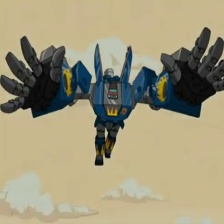

Frame: /content/new_resized_frames/frame3140.jpg
Prediction: Non-violent
Probability: [0.71893936 0.28106064]


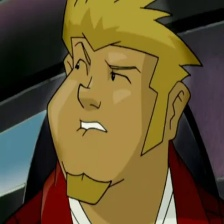

Frame: /content/new_resized_frames/frame1280.jpg
Prediction: Non-violent
Probability: [0.63109657 0.36890343]


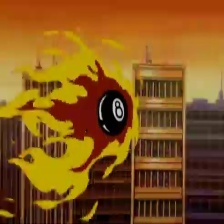

Frame: /content/new_resized_frames/frame3950.jpg
Prediction: Non-violent
Probability: [0.74196594 0.25803406]


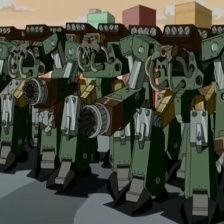

Frame: /content/new_resized_frames/frame630.jpg
Prediction: Non-violent
Probability: [0.63942984 0.36057016]


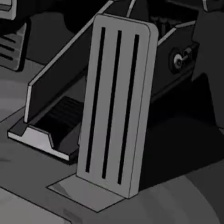

Frame: /content/new_resized_frames/frame4080.jpg
Prediction: Non-violent
Probability: [0.64119787 0.35880213]


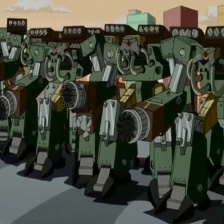

Frame: /content/new_resized_frames/frame610.jpg
Prediction: Non-violent
Probability: [0.56768581 0.43231419]


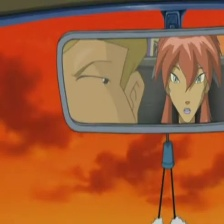

Frame: /content/new_resized_frames/frame3460.jpg
Prediction: Non-violent
Probability: [0.68108459 0.31891541]


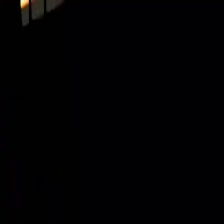

Frame: /content/new_resized_frames/frame4460.jpg
Prediction: Non-violent
Probability: [0.58464039 0.41535961]


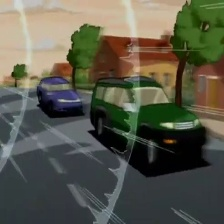

Frame: /content/new_resized_frames/frame2420.jpg
Prediction: Non-violent
Probability: [0.67993739 0.32006261]


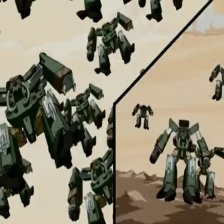

Frame: /content/new_resized_frames/frame450.jpg
Prediction: Non-violent
Probability: [0.5484862 0.4515138]


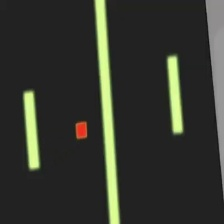

Frame: /content/new_resized_frames/frame2940.jpg
Prediction: Non-violent
Probability: [0.62504287 0.37495713]


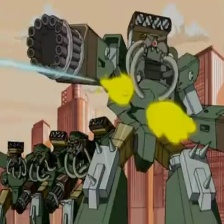

Frame: /content/new_resized_frames/frame4180.jpg
Prediction: Non-violent
Probability: [0.6528 0.3472]


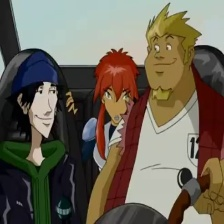

Frame: /content/new_resized_frames/frame4630.jpg
Prediction: Non-violent
Probability: [0.63354017 0.36645983]


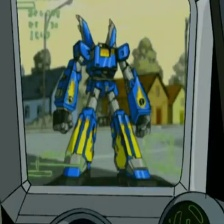

Frame: /content/new_resized_frames/frame740.jpg
Prediction: Non-violent
Probability: [0.64142458 0.35857542]


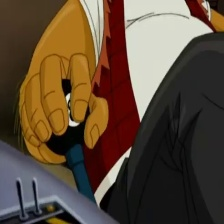

Frame: /content/new_resized_frames/frame3710.jpg
Prediction: Non-violent
Probability: [0.63582976 0.36417024]


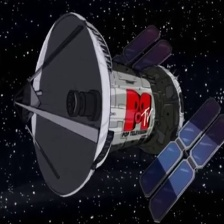

Frame: /content/new_resized_frames/frame2000.jpg
Prediction: Non-violent
Probability: [0.69848435 0.30151565]


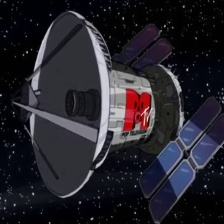

Frame: /content/new_resized_frames/frame2010.jpg
Prediction: Non-violent
Probability: [0.69519624 0.30480376]


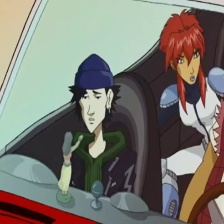

Frame: /content/new_resized_frames/frame0.jpg
Prediction: Non-violent
Probability: [0.66244417 0.33755583]


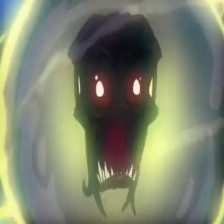

Frame: /content/new_resized_frames/frame1020.jpg
Prediction: Non-violent
Probability: [0.55049814 0.44950186]


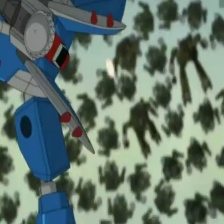

Frame: /content/new_resized_frames/frame2640.jpg
Prediction: Non-violent
Probability: [0.69090467 0.30909533]


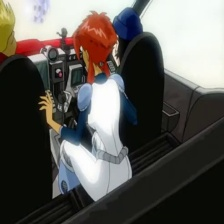

Frame: /content/new_resized_frames/frame410.jpg
Prediction: Non-violent
Probability: [0.69141759 0.30858241]


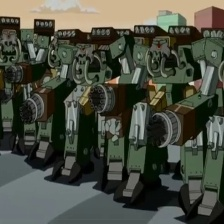

Frame: /content/new_resized_frames/frame600.jpg
Prediction: Non-violent
Probability: [0.60647073 0.39352927]


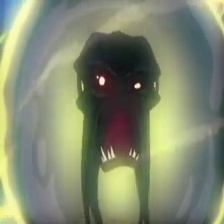

Frame: /content/new_resized_frames/frame1040.jpg
Prediction: Non-violent
Probability: [0.63207726 0.36792274]


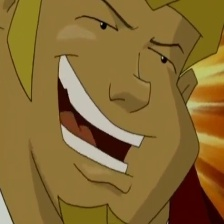

Frame: /content/new_resized_frames/frame1530.jpg
Prediction: Non-violent
Probability: [0.58943538 0.41056462]


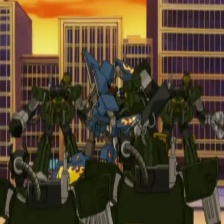

Frame: /content/new_resized_frames/frame2820.jpg
Prediction: Non-violent
Probability: [0.60348746 0.39651254]


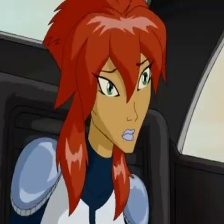

Frame: /content/new_resized_frames/frame1160.jpg
Prediction: Non-violent
Probability: [0.7122518 0.2877482]


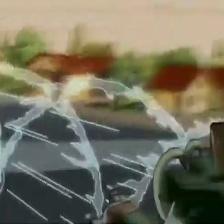

Frame: /content/new_resized_frames/frame2350.jpg
Prediction: Non-violent
Probability: [0.61909412 0.38090588]


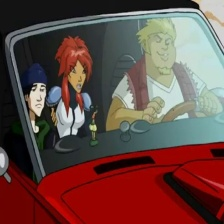

Frame: /content/new_resized_frames/frame1670.jpg
Prediction: Non-violent
Probability: [0.68919536 0.31080464]


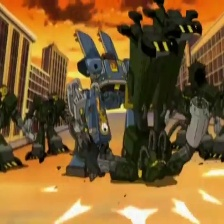

Frame: /content/new_resized_frames/frame2890.jpg
Prediction: Non-violent
Probability: [0.57117783 0.42882217]


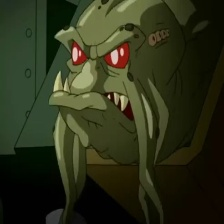

Frame: /content/new_resized_frames/frame3820.jpg
Prediction: Violent
Probability: [0.42257873 0.57742127]


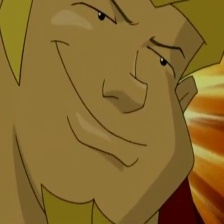

Frame: /content/new_resized_frames/frame1570.jpg
Prediction: Non-violent
Probability: [0.54417544 0.45582456]


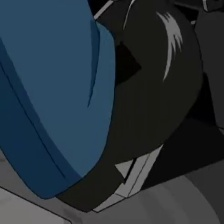

Frame: /content/new_resized_frames/frame4090.jpg
Prediction: Non-violent
Probability: [0.5504508 0.4495492]


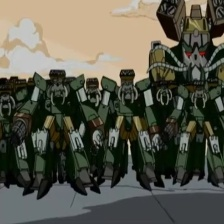

Frame: /content/new_resized_frames/frame1200.jpg
Prediction: Non-violent
Probability: [0.51453 0.48547]


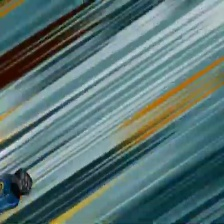

Frame: /content/new_resized_frames/frame4330.jpg
Prediction: Non-violent
Probability: [0.74942677 0.25057323]


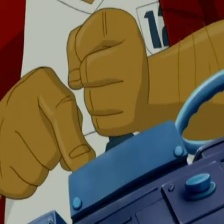

Frame: /content/new_resized_frames/frame2500.jpg
Prediction: Non-violent
Probability: [0.68667554 0.31332446]


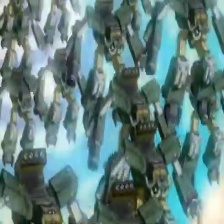

Frame: /content/new_resized_frames/frame380.jpg
Prediction: Non-violent
Probability: [0.5 0.5]


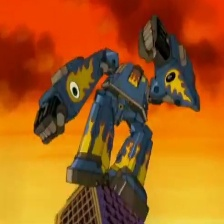

Frame: /content/new_resized_frames/frame3740.jpg
Prediction: Non-violent
Probability: [0.64638104 0.35361896]


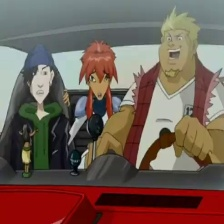

Frame: /content/new_resized_frames/frame4510.jpg
Prediction: Non-violent
Probability: [0.74191116 0.25808884]


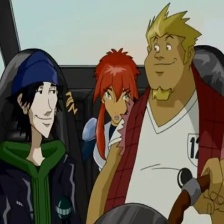

Frame: /content/new_resized_frames/frame4670.jpg
Prediction: Non-violent
Probability: [0.63640565 0.36359435]


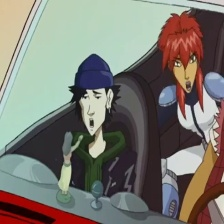

Frame: /content/new_resized_frames/frame10.jpg
Prediction: Non-violent
Probability: [0.6630462 0.3369538]


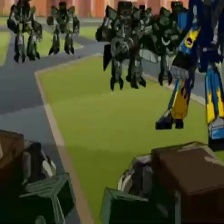

Frame: /content/new_resized_frames/frame2760.jpg
Prediction: Non-violent
Probability: [0.60621255 0.39378745]


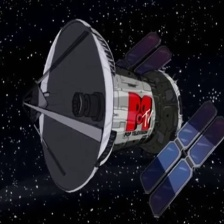

Frame: /content/new_resized_frames/frame1950.jpg
Prediction: Non-violent
Probability: [0.71601474 0.28398526]


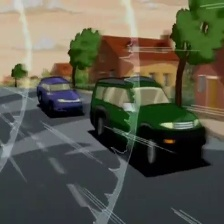

Frame: /content/new_resized_frames/frame2410.jpg
Prediction: Non-violent
Probability: [0.66914822 0.33085178]


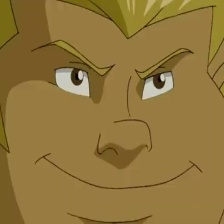

Frame: /content/new_resized_frames/frame2460.jpg
Prediction: Non-violent
Probability: [0.5264292 0.4735708]


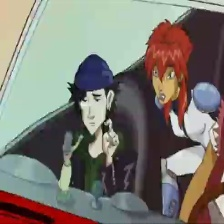

Frame: /content/new_resized_frames/frame320.jpg
Prediction: Non-violent
Probability: [0.63763897 0.36236103]


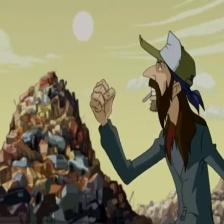

Frame: /content/new_resized_frames/frame3110.jpg
Prediction: Non-violent
Probability: [0.50679251 0.49320749]


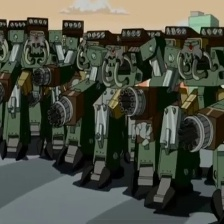

Frame: /content/new_resized_frames/frame590.jpg
Prediction: Non-violent
Probability: [0.63970237 0.36029763]


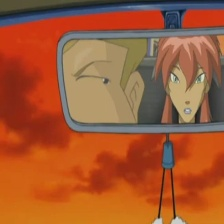

Frame: /content/new_resized_frames/frame3520.jpg
Prediction: Non-violent
Probability: [0.67193441 0.32806559]


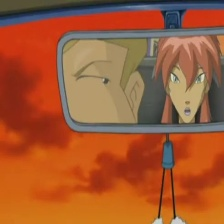

Frame: /content/new_resized_frames/frame3510.jpg
Prediction: Non-violent
Probability: [0.67740483 0.32259517]


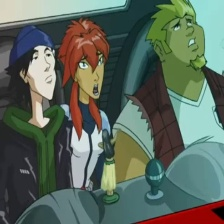

Frame: /content/new_resized_frames/frame1870.jpg
Prediction: Non-violent
Probability: [0.69431933 0.30568067]


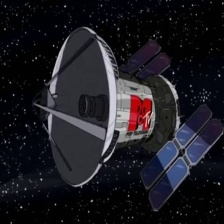

Frame: /content/new_resized_frames/frame1890.jpg
Prediction: Non-violent
Probability: [0.70084923 0.29915077]


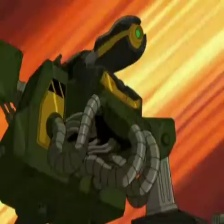

Frame: /content/new_resized_frames/frame3200.jpg
Prediction: Non-violent
Probability: [0.57962079 0.42037921]


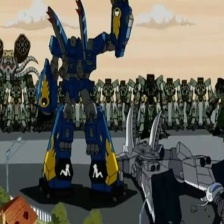

Frame: /content/new_resized_frames/frame1360.jpg
Prediction: Non-violent
Probability: [0.60715032 0.39284968]


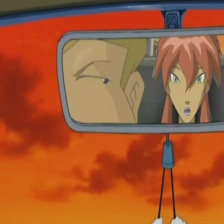

Frame: /content/new_resized_frames/frame3540.jpg
Prediction: Non-violent
Probability: [0.66575474 0.33424526]


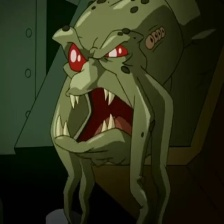

Frame: /content/new_resized_frames/frame3860.jpg
Prediction: Non-violent
Probability: [0.45293989 0.54706011]


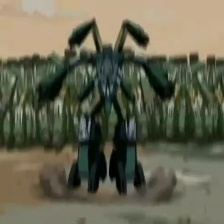

Frame: /content/new_resized_frames/frame660.jpg
Prediction: Non-violent
Probability: [0.63072262 0.36927738]


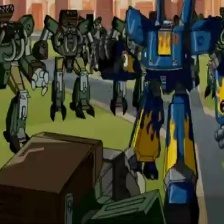

Frame: /content/new_resized_frames/frame2730.jpg
Prediction: Non-violent
Probability: [0.62180568 0.37819432]


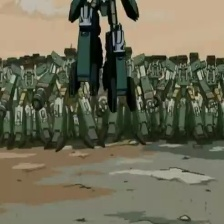

Frame: /content/new_resized_frames/frame650.jpg
Prediction: Non-violent
Probability: [0.53107056 0.46892944]


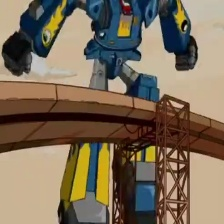

Frame: /content/new_resized_frames/frame2980.jpg
Prediction: Non-violent
Probability: [0.67222114 0.32777886]


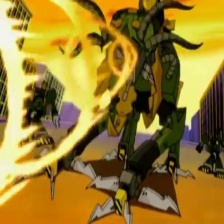

Frame: /content/new_resized_frames/frame4260.jpg
Prediction: Non-violent
Probability: [0.49248717 0.50751283]


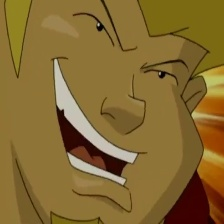

Frame: /content/new_resized_frames/frame1630.jpg
Prediction: Non-violent
Probability: [0.58438456 0.41561544]


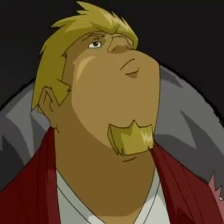

Frame: /content/new_resized_frames/frame2210.jpg
Prediction: Non-violent
Probability: [0.71340882 0.28659118]


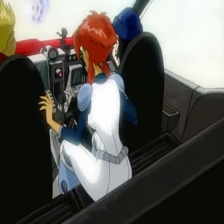

Frame: /content/new_resized_frames/frame400.jpg
Prediction: Non-violent
Probability: [0.67794042 0.32205958]


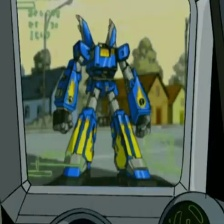

Frame: /content/new_resized_frames/frame730.jpg
Prediction: Non-violent
Probability: [0.64487075 0.35512925]


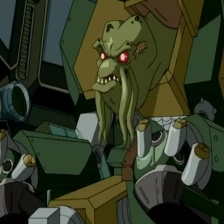

Frame: /content/new_resized_frames/frame820.jpg
Prediction: Non-violent
Probability: [0.54843403 0.45156597]


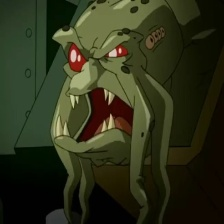

Frame: /content/new_resized_frames/frame3880.jpg
Prediction: Non-violent
Probability: [0.45122759 0.54877241]


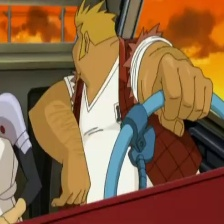

Frame: /content/new_resized_frames/frame3260.jpg
Prediction: Non-violent
Probability: [0.66284979 0.33715021]


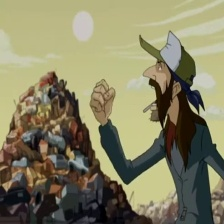

Frame: /content/new_resized_frames/frame3090.jpg
Prediction: Non-violent
Probability: [0.50855806 0.49144194]


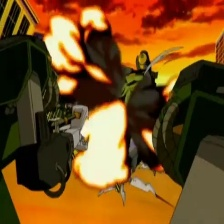

Frame: /content/new_resized_frames/frame4440.jpg
Prediction: Non-violent
Probability: [0.54734288 0.45265712]


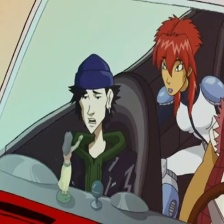

Frame: /content/new_resized_frames/frame60.jpg
Prediction: Non-violent
Probability: [0.66890482 0.33109518]


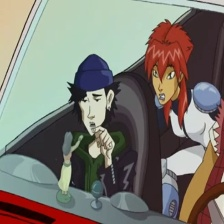

Frame: /content/new_resized_frames/frame310.jpg
Prediction: Non-violent
Probability: [0.67261271 0.32738729]


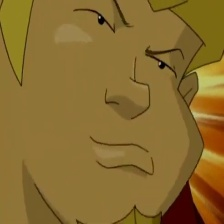

Frame: /content/new_resized_frames/frame1580.jpg
Prediction: Non-violent
Probability: [0.4794713 0.5205287]


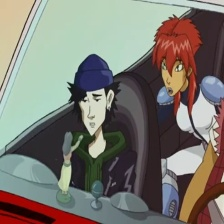

Frame: /content/new_resized_frames/frame230.jpg
Prediction: Non-violent
Probability: [0.656354 0.343646]


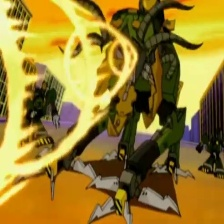

Frame: /content/new_resized_frames/frame4240.jpg
Prediction: Non-violent
Probability: [0.50697698 0.49302302]


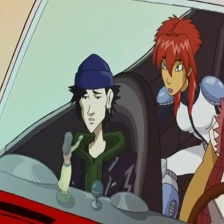

Frame: /content/new_resized_frames/frame70.jpg
Prediction: Non-violent
Probability: [0.66528537 0.33471463]


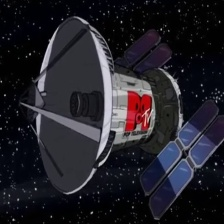

Frame: /content/new_resized_frames/frame1970.jpg
Prediction: Non-violent
Probability: [0.71314262 0.28685738]


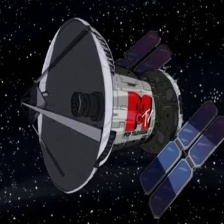

Frame: /content/new_resized_frames/frame1960.jpg
Prediction: Non-violent
Probability: [0.71360863 0.28639137]


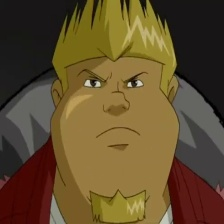

Frame: /content/new_resized_frames/frame2230.jpg
Prediction: Non-violent
Probability: [0.68494851 0.31505149]


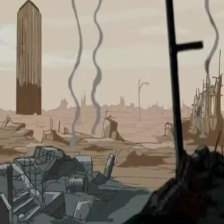

Frame: /content/new_resized_frames/frame4570.jpg
Prediction: Non-violent
Probability: [0.60827432 0.39172568]


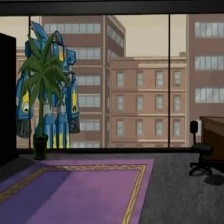

Frame: /content/new_resized_frames/frame3910.jpg
Prediction: Non-violent
Probability: [0.76733201 0.23266799]


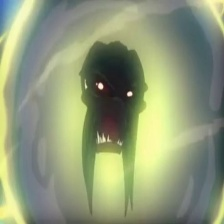

Frame: /content/new_resized_frames/frame1120.jpg
Prediction: Non-violent
Probability: [0.60506884 0.39493116]


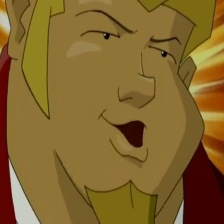

Frame: /content/new_resized_frames/frame1470.jpg
Prediction: Non-violent
Probability: [0.48496832 0.51503168]


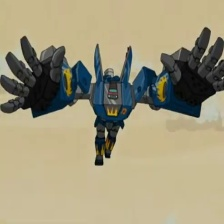

Frame: /content/new_resized_frames/frame3130.jpg
Prediction: Non-violent
Probability: [0.7297974 0.2702026]


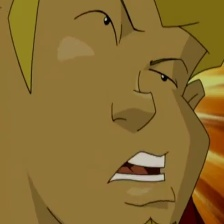

Frame: /content/new_resized_frames/frame1620.jpg
Prediction: Non-violent
Probability: [0.51446308 0.48553692]


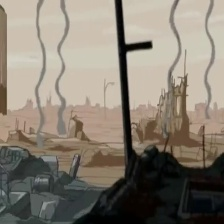

Frame: /content/new_resized_frames/frame4560.jpg
Prediction: Non-violent
Probability: [0.57108935 0.42891065]


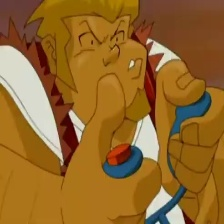

Frame: /content/new_resized_frames/frame4160.jpg
Prediction: Non-violent
Probability: [0.59572431 0.40427569]


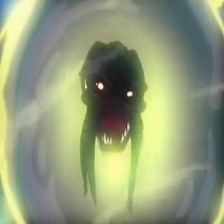

Frame: /content/new_resized_frames/frame1130.jpg
Prediction: Non-violent
Probability: [0.59408844 0.40591156]


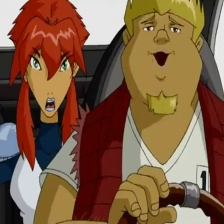

Frame: /content/new_resized_frames/frame1380.jpg
Prediction: Non-violent
Probability: [0.71880627 0.28119373]


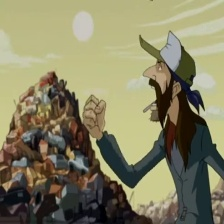

Frame: /content/new_resized_frames/frame3070.jpg
Prediction: Non-violent
Probability: [0.5 0.5]


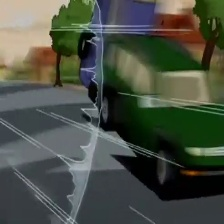

Frame: /content/new_resized_frames/frame2440.jpg
Prediction: Non-violent
Probability: [0.69063523 0.30936477]


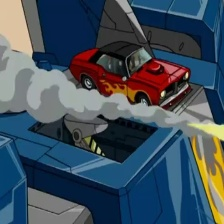

Frame: /content/new_resized_frames/frame1760.jpg
Prediction: Non-violent
Probability: [0.68572583 0.31427417]


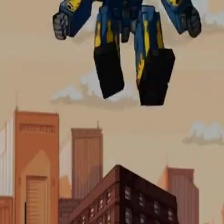

Frame: /content/new_resized_frames/frame3690.jpg
Prediction: Non-violent
Probability: [0.61676952 0.38323048]


In [ ]:
from IPython.display import display, Image

def display_predictions_with_frames(frame_paths, predictions, probabilities):
    for frame_path, prediction, probability in zip(frame_paths, predictions, probabilities):
        display(Image(filename=frame_path))
        print(f"Frame: {frame_path}")
        print(f"Prediction: {'Violent' if prediction == 1 else 'Non-violent'}")
        print(f"Probability: {probability}")

# Predict using the loaded model
predictions = loaded_model.predict(new_features)
probabilities = loaded_model.predict_proba(new_features)

# Display frames with predictions
display_predictions_with_frames(frame_paths, predictions, probabilities)

In [ ]:
# Mount Google Drive
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
from sklearn.metrics import confusion_matrix, classification_report
import seaborn as sns
import matplotlib.pyplot as plt

In [ ]:
import joblib

# Load the trained model
model_filename = '/content/drive/MyDrive/violent_detection_model.pkl'  # Update this path
model = joblib.load(model_filename)

# Load the features and labels
data = np.load('/content/drive/MyDrive/updated_features_labels.npz')  # Update this path
features = data['features']
labels = data['labels']

In [ ]:
from sklearn.model_selection import train_test_split

# Ensure the labels do not include any unlabeled data (-1)
labeled_indices = labels != -1
features_labeled = features[labeled_indices]
labels_labeled = labels[labeled_indices]

# Split the labeled data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(features_labeled, labels_labeled, test_size=0.2, random_state=42, stratify=labels_labeled)

In [ ]:
# Predict on the test set
predictions = model.predict(X_test)

# Print the accuracy
print(f"Initial accuracy: {accuracy_score(y_test, predictions)}")

Initial accuracy: 0.82


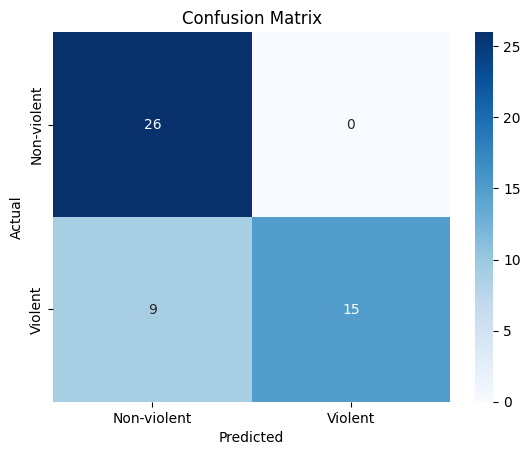

In [ ]:
# Confusion Matrix
conf_matrix = confusion_matrix(y_test, predictions)
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", xticklabels=['Non-violent', 'Violent'], yticklabels=['Non-violent', 'Violent'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

In [ ]:
# Classification Report
print(classification_report(y_test, predictions, target_names=['Non-violent', 'Violent']))

              precision    recall  f1-score   support

 Non-violent       0.74      1.00      0.85        26
     Violent       1.00      0.62      0.77        24

    accuracy                           0.82        50
   macro avg       0.87      0.81      0.81        50
weighted avg       0.87      0.82      0.81        50



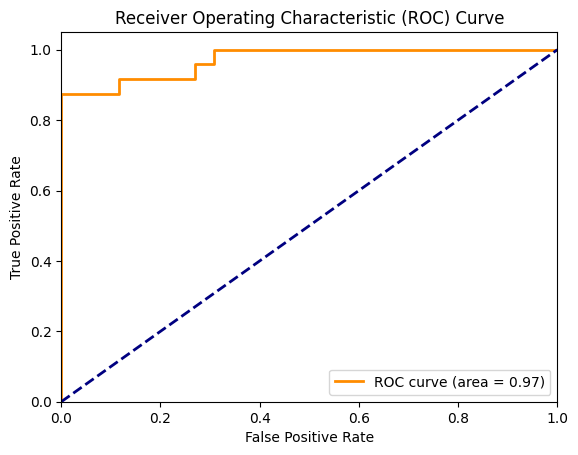

In [ ]:
from sklearn.metrics import roc_curve, auc

# Compute ROC curve and AUC for the positive class
fpr, tpr, _ = roc_curve(y_test, model.decision_function(X_test))
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (area = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

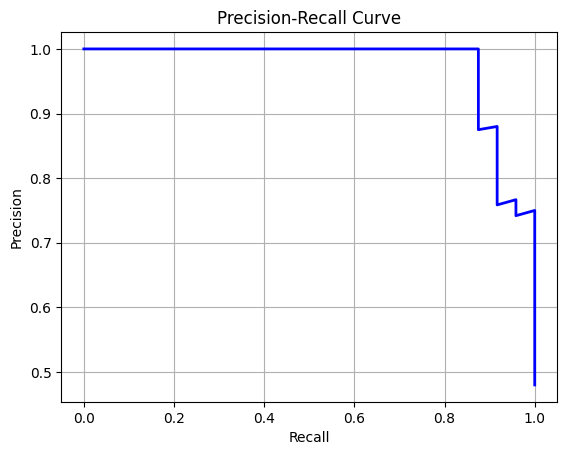

In [ ]:
from sklearn.metrics import precision_recall_curve

# Compute precision-recall curve
precision, recall, _ = precision_recall_curve(y_test, model.decision_function(X_test))

# Plot precision-recall curve
plt.figure()
plt.plot(recall, precision, color='b', lw=2)
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve')
plt.grid(True)
plt.show()

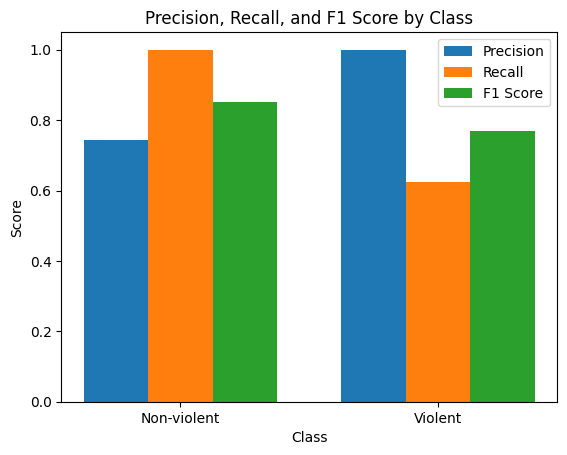

In [ ]:
from sklearn.metrics import precision_score, recall_score, f1_score

# Calculate precision, recall, and F1-score for each class
precision = precision_score(y_test, predictions, average=None)
recall = recall_score(y_test, predictions, average=None)
f1 = f1_score(y_test, predictions, average=None)

# Plot the metrics
labels = ['Non-violent', 'Violent']
x = np.arange(len(labels))
width = 0.25

fig, ax = plt.subplots()
ax.bar(x - width, precision, width, label='Precision')
ax.bar(x, recall, width, label='Recall')
ax.bar(x + width, f1, width, label='F1 Score')

ax.set_xlabel('Class')
ax.set_ylabel('Score')
ax.set_title('Precision, Recall, and F1 Score by Class')
ax.set_xticks(x)
ax.set_xticklabels(labels)
ax.legend()

plt.show()